# Etiquetas usadas en label-studio

<View>
  <Header value="Anotacion de Actividades Humanas - Secuencia Completa"/>
  
  <Header value="Velocidad del Video:"/>
  <Choices name="velocidad" toName="video" choice="single" showInline="true">
    <Choice value="Rapido"/>
    <Choice value="Normal"/>
    <Choice value="Lento"/>
  </Choices>
  
  <Header value="Instrucciones: Etiquetar TODA la secuencia incluyendo estados estaticos"/>
  
  <TimelineLabels name="videoLabels" toName="video">
    <!-- Estados Estaticos -->
    <Label value="Parado sin movimiento" background="#9E9E9E" hotkey="0"/>
    <Label value="Sentado sin movimiento" background="#424242" hotkey="q"/>
    
    <!-- Locomocion -->
    <Label value="Caminar acercandose" background="#2196F3" hotkey="1"/>
    <Label value="Caminar alejandose (espaldas)" background="#00BCD4" hotkey="2"/>
    
    <!-- Giros -->
    <Label value="Giro 180 derecha" background="#4CAF50" hotkey="3"/>
    <Label value="Giro 180 izquierda" background="#CDDC39" hotkey="4"/>
    
    <!-- Transiciones Posturales -->
    <Label value="Sentarse" background="#FF9800" hotkey="5"/>
    <Label value="Ponerse de pie" background="#FF5722" hotkey="6"/>
    
    <!-- Inclinaciones -->
    <Label value="Inclinarse izquierda" background="#9C27B0" hotkey="7"/>
    <Label value="Inclinarse derecha" background="#E91E63" hotkey="8"/>
    
    <!-- Ejercicios -->
    <Label value="Sentadillas" background="#F44336" hotkey="9"/>
  </TimelineLabels>
  
  <Video name="video" value="$video" timelineHeight="120"/>
  
  <Header value="Informacion del Segmento:"/>
  
  <Choices name="paso" toName="video" choice="single" perRegion="true">
    <Choice value="Paso 1 - Parado inicial"/>
    <Choice value="Paso 2 - Caminar 1"/>
    <Choice value="Paso 3 - Giro 1"/>
    <Choice value="Paso 4 - Caminar espaldas"/>
    <Choice value="Paso 5 - Giro 2"/>
    <Choice value="Paso 6 - Sentarse"/>
    <Choice value="Paso 6b - Sentado estatico"/>
    <Choice value="Paso 7 - Ponerse de pie"/>
    <Choice value="Paso 8 - Caminar 2"/>
    <Choice value="Paso 9 - Inclinacion 1"/>
    <Choice value="Paso 10 - Inclinacion 2"/>
    <Choice value="Paso 11 - Parado intermedio"/>
    <Choice value="Paso 12 - Sentadillas"/>
    <Choice value="Paso 13 - Parado final"/>
  </Choices>
  
  <Number name="repeticiones" toName="video" min="2" max="3" perRegion="true" placeholder="Solo sentadillas: 2 o 3"/>
  
  <Choices name="calidad" toName="video" choice="single" perRegion="true">
    <Choice value="Fluida"/>
    <Choice value="Con vacilacion"/>
    <Choice value="Perdida balance"/>
    <Choice value="No aplica (estatico)"/>
  </Choices>
  
  <TextArea name="notas" toName="video" rows="2" placeholder="Observaciones del video"/>

</View>


# Integrantes
* Luis Manuel Rojas Correa
* William Joseph Verdesoto
* Juan Camilo Corrales Osvath

# Análisis Exploratorio de Datos (EDA) para Reconocimiento de Actividades Humanas

## Contexto del Proyecto

Este notebook contiene un proceso completo y detallado para realizar un Análisis Exploratorio de Datos (EDA) sobre datos de movimiento humano, capturados y procesados con MediaPipe y anotados con Label Studio.

## Estructura del Notebook

1. Configuración del Entorno
2. Carga y Parseo de Datos
3. Inspección Inicial del Dataset
4. Análisis de Calidad de Datos
5. Análisis de Distribución de Clases
6. Normalización de Coordenadas
7. Ingeniería de Características Cinemáticas
8. Análisis Estadístico Descriptivo
9. Visualización de Series Temporales
10. Análisis de Distribuciones por Clase
11. Análisis de Correlación
12. Análisis y Mitigación de Ruido
13. Análisis de Separabilidad

## Actividades a Clasificar

- Acercarse a la cámara (approach)
- Alejarse de la cámara (walk_away)
- Girar (turn)
- Sentarse (sit)
- Ponerse de pie (stand)


### 1. Configuración del Entorno

In [ ]:
!pip install gdown
!pip install imbalanced-learn

In [ ]:
# Manipulación de datos
import pandas as pd
import numpy as np
import json
import glob
import os
import gdown
from collections import Counter

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Procesamiento de señales y estadística
from scipy.signal import savgol_filter
from scipy import stats
from scipy.stats import mode

# Machine Learning (para análisis)
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from imblearn.over_sampling import SMOTE

# Utilidades
import warnings
warnings.filterwarnings('ignore')

print("Librerías importadas correctamente")

Librerías importadas correctamente


### Configuración de Estilos de Visualización

In [ ]:
# Estilo para Matplotlib y Seaborn
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

print("Estilos de visualización configurados")

Estilos de visualización configurados


### Definición de Rutas y Landmarks

In [ ]:
# Nombres de los landmarks según MediaPipe Pose
LANDMARK_NAMES = [
    'nose', 'left_eye_inner', 'left_eye', 'left_eye_outer', 'right_eye_inner', 'right_eye', 'right_eye_outer',
    'left_ear', 'right_ear', 'mouth_left', 'mouth_right', 'left_shoulder', 'right_shoulder',
    'left_elbow', 'right_elbow', 'left_wrist', 'right_wrist', 'left_pinky', 'right_pinky',
    'left_index', 'right_index', 'left_thumb', 'right_thumb', 'left_hip', 'right_hip',
    'left_knee', 'right_knee', 'left_ankle', 'right_ankle', 'left_heel', 'right_heel',
    'left_foot_index', 'right_foot_index'
]

# Landmarks relevantes según el enunciado del proyecto
RELEVANT_LANDMARKS_NAMES = [
    'nose', 'left_shoulder', 'right_shoulder', 'left_hip', 'right_hip',
    'left_knee', 'right_knee', 'left_ankle', 'right_ankle', 'left_wrist', 'right_wrist'
]

# Índices de los landmarks relevantes
RELEVANT_LANDMARKS_INDICES = [LANDMARK_NAMES.index(name) for name in RELEVANT_LANDMARKS_NAMES]

print(f"Landmarks relevantes: {len(RELEVANT_LANDMARKS_NAMES)}")
print(f"Índices: {RELEVANT_LANDMARKS_INDICES}")

Landmarks relevantes: 11
Índices: [0, 11, 12, 23, 24, 25, 26, 27, 28, 15, 16]


### 2. Carga y Parseo de Datos

#### Función para Cargar Datos de Todos los Videos

In [ ]:
def load_all_videos_data(json_path):
    """
    Carga los datos de landmarks desde el archivo JSON consolidado de MediaPipe.
    """
    print(f"Cargando datos de landmarks desde: {json_path}")
    all_landmarks = []

    try:
        with open(json_path, 'r') as f:
            data = json.load(f)

        for video_filename_raw, video_data in data.items():
            video_name = os.path.splitext(video_filename_raw)[0].replace('-', '_')

            for frame_data in video_data:
                frame_number = frame_data.get('frame', -1)
                landmarks = frame_data.get('landmarks', [])

                if frame_number == -1 or not landmarks:
                    continue
                # Usamos enumerate() para obtener el índice (landmark_id)
                for landmark_id, landmark_data in enumerate(landmarks):

                    # landmark_id será 0, 1, 2, 3...
                    if landmark_id in RELEVANT_LANDMARKS_INDICES:
                        all_landmarks.append({
                            'video_name': video_name,
                            'frame': frame_number,
                            'landmark_id': landmark_id,
                            'landmark_name': LANDMARK_NAMES[landmark_id],
                            'x': landmark_data.get('x'),
                            'y': landmark_data.get('y'),
                            'z': landmark_data.get('z'),
                            'visibility': landmark_data.get('visibility', 0.0)
                        })

        return pd.DataFrame(all_landmarks)

    except json.JSONDecodeError as e:
        print(f"Error al decodificar JSON de {json_path}: {e}")
        return pd.DataFrame()
    except Exception as e:
        print(f"Error al cargar datos desde {json_path}: {e}")
        return pd.DataFrame()

print("Función load_all_videos_data (corregida v2) definida.")

Función load_all_videos_data (corregida v2) definida.


#### Función para Cargar Datos de Anotaciones de Label Studio

In [ ]:

def load_annotations_data(json_path):
    """
    Carga los datos de anotaciones desde el archivo JSON de Label Studio.
    Limpia los nombres de video para la fusión.
    """
    print(f"Cargando anotaciones desde: {json_path}")
    with open(json_path, 'r') as f:
        annotations = json.load(f)

    segment_data = []

    # Mapeo de etiquetas
    label_mapping = {
        "Caminar acercandose": "approach",
        "Caminar alejandose (espaldas)": "walk_away",
        "Giro 180 derecha": "turn",
        "Giro 180 izquierda": "turn",
        "Sentarse": "sit",
        "Ponerse de pie": "stand",
        "Parado sin movimiento": "static_stand",
        "Sentado sin movimiento": "static_sit",
        "Inclinarse izquierda": "incline_left",
        "Inclinarse derecha": "incline_right",
        "Sentadillas": "squats"
    }

    for video_annotation in annotations:
        # Extraer nombre del video
        video_filename_raw = os.path.basename(video_annotation['data']['video'])

        # Limpieza de Nombre
        # "adac5c47-VIDEO_01.mp4" -> "VIDEO_01.mp4"
        video_filename_common = video_filename_raw.split('-')[-1]
        # "VIDEO_01.mp4" -> "VIDEO_01"
        video_name = os.path.splitext(video_filename_common)[0].replace('-', '_')

        for result in video_annotation['annotations'][0]['result']:

            # 'timelinelabels'
            if 'timelinelabels' in result['value']:
                label_studio_value = result['value']['timelinelabels'][0]

                # Usar 'ranges' (frames)
                ranges = result['value'].get('ranges')
                if not ranges:
                    continue

                start_frame = ranges[0]['start']
                end_frame = ranges[0]['end']

                mapped_label = label_mapping.get(label_studio_value, 'unlabeled')

                if mapped_label != 'unlabeled':
                    segment_data.append({
                        'video_name': video_name,
                        'start_frame': int(start_frame), # frames
                        'end_frame': int(end_frame),
                        'label': mapped_label
                    })

    return pd.DataFrame(segment_data)

print("Función load_annotations_data (corregida) definida.")

Función load_annotations_data (corregida) definida.


#### Carga Principal de Datos

In [ ]:
print("Descargando archivos de datos desde Google Drive...")

# IDs de archivos
LANDMARKS_FILE_ID = '1eqItE3VRVlUceY5QlYSrGZSGMJJopBeB'
ANNOTATIONS_FILE_ID = '1CgLyHk5i5qBJO9o6mXUS64FAfpWKFc7w'

# Nombres de archivo locales
LANDMARKS_JSON_PATH = 'all_video_landmarks.json'
ANNOTATIONS_JSON_PATH = 'VIDEOS_FINAL_TALLER_LABELING.json'

# Descargar los archivos
print("Descargando landmarks (169 MB)...")
gdown.download(id=LANDMARKS_FILE_ID, output=LANDMARKS_JSON_PATH, quiet=False)
print("Descargando anotaciones (75 KB)...")
gdown.download(id=ANNOTATIONS_FILE_ID, output=ANNOTATIONS_JSON_PATH, quiet=False)

print("\nArchivos descargados.")
print("Iniciando carga de datos en DataFrames...")

# Cargar los datos usando las funciones corregidas
df_landmarks = load_all_videos_data(LANDMARKS_JSON_PATH)
print(f"Total de registros de landmarks: {len(df_landmarks)}")

df_annotations = load_annotations_data(ANNOTATIONS_JSON_PATH)
print(f"Total de segmentos anotados: {len(df_annotations)}")

print("\nPrimeros registros de landmarks:")
display(df_landmarks.head())

print("\nPrimeros registros de anotaciones:")
display(df_annotations.head())

Descargando archivos de datos desde Google Drive...
Descargando landmarks (169 MB)...


Downloading...
From (original): https://drive.google.com/uc?id=1eqItE3VRVlUceY5QlYSrGZSGMJJopBeB
From (redirected): https://drive.google.com/uc?id=1eqItE3VRVlUceY5QlYSrGZSGMJJopBeB&confirm=t&uuid=c5ab26f0-0fd0-4e86-be6d-99de964be908
To: /content/all_video_landmarks.json
100%|██████████| 177M/177M [00:01<00:00, 101MB/s] 


Descargando anotaciones (75 KB)...


Downloading...
From: https://drive.google.com/uc?id=1CgLyHk5i5qBJO9o6mXUS64FAfpWKFc7w
To: /content/VIDEOS_FINAL_TALLER_LABELING.json
100%|██████████| 76.6k/76.6k [00:00<00:00, 64.1MB/s]



Archivos descargados.
Iniciando carga de datos en DataFrames...
Cargando datos de landmarks desde: all_video_landmarks.json
Total de registros de landmarks: 256982
Cargando anotaciones desde: VIDEOS_FINAL_TALLER_LABELING.json
Total de segmentos anotados: 291

Primeros registros de landmarks:


,video_name,frame,landmark_id,landmark_name,x,y,z,visibility
0,VIDEO_018,0,0,nose,0.103172,0.495837,-0.130592,0.999959
1,VIDEO_018,0,11,left_shoulder,0.129352,0.454540,-0.045825,0.999970
2,VIDEO_018,0,12,right_shoulder,0.130733,0.531055,-0.031944,0.999859
3,VIDEO_018,0,15,left_wrist,0.197467,0.446207,-0.070213,0.989244
4,VIDEO_018,0,16,right_wrist,0.199323,0.544157,-0.050217,0.957398



Primeros registros de anotaciones:


,video_name,start_frame,end_frame,label
0,VIDEO_01,1,50,static_stand
1,VIDEO_01,50,213,approach
2,VIDEO_01,213,276,static_stand
3,VIDEO_01,276,359,turn
4,VIDEO_01,359,373,static_stand


#### Asignación de Etiquetas y Segmentos a los Frames

In [ ]:
# Asignar etiquetas a cada frame
print("Asignando etiquetas a los frames de landmarks...")
df_landmarks['label'] = 'unlabeled'

for idx, row in df_annotations.iterrows():
    mask = (
        (df_landmarks['video_name'] == row['video_name']) &
        (df_landmarks['frame'] >= row['start_frame']) &
        (df_landmarks['frame'] <= row['end_frame'])
    )
    df_landmarks.loc[mask, 'label'] = row['label']

# Asignar ID único a cada segmento
df_landmarks['segment_id'] = (df_landmarks['label'] != df_landmarks['label'].shift(1)).cumsum()

# Filtrar solo frames etiquetados
df_landmarks_labeled = df_landmarks[df_landmarks['label'] != 'unlabeled'].copy()

print(f"\n¡Fusión completada!")
print(f"Total de frames etiquetados: {len(df_landmarks_labeled)}")
print(f"Total de frames sin etiquetar (descartados): {len(df_landmarks[df_landmarks['label'] == 'unlabeled'])}")
print(f"Total de segmentos únicos encontrados: {df_landmarks_labeled['segment_id'].nunique()}")

# Sobrescribir el dataframe principal para continuar el EDA
df_landmarks = df_landmarks_labeled

# Verificar la fusión
print("\nConteo de frames por actividad (verificación):")
print(df_landmarks['label'].value_counts())

Asignando etiquetas a los frames de landmarks...

¡Fusión completada!
Total de frames etiquetados: 188364
Total de frames sin etiquetar (descartados): 68618
Total de segmentos únicos encontrados: 279

Conteo de frames por actividad (verificación):
label
approach         45320
squats           33825
static_stand     23078
turn             20592
walk_away        18073
incline_left     11407
incline_right    10406
sit              10296
stand             8228
static_sit        7139
Name: count, dtype: int64


### 3. Inspección Inicial del Dataset

In [ ]:
print("=" * 60)
print("SECCIÓN 3: INSPECCIÓN INICIAL DEL DATASET")
print("=" * 60)

print(f"\nDimensiones: {df_landmarks.shape}")
print(f"Filas: {df_landmarks.shape[0]}, Columnas: {df_landmarks.shape[1]}")

print("\nInformación del DataFrame:")
df_landmarks.info()

print("\nPrimeras 10 filas:")
display(df_landmarks.head(10))

print("\nEstadísticas descriptivas:")
display(df_landmarks[['x', 'y', 'z', 'visibility']].describe())

print("\nDistribución de landmarks:")
print(df_landmarks['landmark_name'].value_counts())

SECCIÓN 3: INSPECCIÓN INICIAL DEL DATASET

Dimensiones: (188364, 10)
Filas: 188364, Columnas: 10

Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
Index: 188364 entries, 11 to 236224
Data columns (total 10 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   video_name     188364 non-null  object 
 1   frame          188364 non-null  int64  
 2   landmark_id    188364 non-null  int64  
 3   landmark_name  188364 non-null  object 
 4   x              188364 non-null  float64
 5   y              188364 non-null  float64
 6   z              188364 non-null  float64
 7   visibility     188364 non-null  float64
 8   label          188364 non-null  object 
 9   segment_id     188364 non-null  int64  
dtypes: float64(4), int64(3), object(3)
memory usage: 15.8+ MB

Primeras 10 filas:


,video_name,frame,landmark_id,landmark_name,x,y,z,visibility,label,segment_id
11,VIDEO_018,1,0,nose,0.102358,0.495827,-0.097876,0.999960,static_stand,2
12,VIDEO_018,1,11,left_shoulder,0.129360,0.454611,-0.027791,0.999964,static_stand,2
13,VIDEO_018,1,12,right_shoulder,0.130533,0.531219,-0.017520,0.999857,static_stand,2
14,VIDEO_018,1,15,left_wrist,0.197351,0.447235,-0.060653,0.988387,static_stand,2
15,VIDEO_018,1,16,right_wrist,0.199142,0.543031,-0.046613,0.955406,static_stand,2
16,VIDEO_018,1,23,left_hip,0.202038,0.471486,-0.005267,0.999670,static_stand,2
17,VIDEO_018,1,24,right_hip,0.202052,0.515432,0.005259,0.999566,static_stand,2
18,VIDEO_018,1,25,left_knee,0.247863,0.473714,0.017184,0.979724,static_stand,2
19,VIDEO_018,1,26,right_knee,0.247784,0.515002,0.025934,0.975237,static_stand,2
20,VIDEO_018,1,27,left_ankle,0.288295,0.476475,0.097665,0.973256,static_stand,2



Estadísticas descriptivas:


,x,y,z,visibility
count,188364.000000,188364.000000,188364.000000,188364.000000
mean,0.220779,0.486974,-0.017460,0.971500
std,0.080353,0.046197,0.089184,0.067418
min,0.031585,0.292450,-0.367826,0.072281
25%,0.164648,0.453988,-0.072200,0.969278
50%,0.220394,0.487137,-0.012906,0.992213
75%,0.279627,0.519380,0.022131,0.999869
max,0.504861,0.713977,0.426909,1.000000



Distribución de landmarks:
landmark_name
nose              17124
left_shoulder     17124
right_shoulder    17124
left_wrist        17124
right_wrist       17124
left_hip          17124
right_hip         17124
left_knee         17124
right_knee        17124
left_ankle        17124
right_ankle       17124
Name: count, dtype: int64


La inspección inicial de los datos revela un conjunto de datos robusto y de alta calidad, ideal para un proyecto de inteligencia artificial enfocado en el análisis de la pose humana. Con un total de 188,364 registros, el dataset destaca por su completitud, ya que no presenta valores nulos, lo cual simplifica significativamente la fase de preprocesamiento. Los tipos de datos son consistentes y apropiados, con coordenadas espaciales (`x`, `y`, `z`) que parecen estar normalizadas, una práctica estándar que beneficia el entrenamiento de modelos. La columna `visibility` muestra una alta confianza promedio en la detección de los puntos de referencia, aunque la presencia de valores mínimos sugiere que podría haber algunas oclusiones o detecciones de baja calidad que merecen ser investigadas. Adicionalmente, la distribución de los `landmark_name` es perfectamente uniforme, lo que indica una captura de datos consistente y balanceada para cada uno de los 11 puntos corporales medidos. En conjunto, estos hallazgos confirman que el dataset es una base sólida para proceder con un análisis exploratorio de datos más profundo y la posterior ingeniería de características.

### 4. Análisis de Calidad de Datos

#### Verificación de Valores Faltantes y Estadísticas de Visibilidad

In [ ]:
print("=" * 60)
print("SECCIÓN 4: ANÁLISIS DE CALIDAD DE DATOS")
print("=" * 60)

print("\nValores faltantes:")
missing_values = df_landmarks.isnull().sum()
if missing_values.sum() == 0:
    print("No hay valores faltantes")
else:
    print(missing_values[missing_values > 0])

print("\nEstadísticas de visibilidad:")
print(df_landmarks['visibility'].describe())

low_visibility_threshold = 0.5
low_vis_count = (df_landmarks['visibility'] < low_visibility_threshold).sum()
print(f"\nRegistros con visibilidad < {low_visibility_threshold}: {low_vis_count} ({low_vis_count/len(df_landmarks)*100:.2f}%)")

SECCIÓN 4: ANÁLISIS DE CALIDAD DE DATOS

Valores faltantes:
No hay valores faltantes

Estadísticas de visibilidad:
count    188364.000000
mean          0.971500
std           0.067418
min           0.072281
25%           0.969278
50%           0.992213
75%           0.999869
max           1.000000
Name: visibility, dtype: float64

Registros con visibilidad < 0.5: 854 (0.45%)




El análisis de calidad de datos confirma la excelente condición del conjunto de datos para el modelado. La ausencia total de valores faltantes es un indicador clave de su robustez y completitud. El análisis de la métrica de `visibility` revela que, en general, las detecciones de los puntos de referencia son altamente confiables, con una confianza promedio del 97.15%. A pesar de esta alta fiabilidad general, se ha identificado una pequeña fracción de datos de menor calidad: específicamente, 854 registros (que representan solo el 0.45% del total) presentan una visibilidad inferior a un umbral de 0.5. Esta proporción mínima de datos potencialmente ruidosos es lo suficientemente pequeña como para ser gestionada o eliminada sin impactar negativamente el volumen de datos, lo que refuerza la alta calidad y fiabilidad del dataset para las siguientes etapas del proyecto.

#### Visualización de la Distribución de Visibilidad

In [ ]:
fig = px.histogram(
    df_landmarks,
    x='visibility',
    nbins=50,
    title='Distribución de la Visibilidad de los Landmarks',
    labels={'visibility': 'Puntuación de Visibilidad'}
)
fig.show()


El histograma de la "Distribución de la Visibilidad de los Landmarks" ilustra de manera contundente la alta calidad de las detecciones de puntos de referencia en el conjunto de datos. La distribución está fuertemente sesgada hacia la izquierda, con una abrumadora concentración de registros en el extremo superior del espectro de visibilidad. Se observa un pico masivo en una puntuación de visibilidad de 1.0, lo que indica que una gran mayoría de los *landmarks* fueron detectados con la máxima confianza posible. A medida que la puntuación de visibilidad disminuye, la frecuencia de los registros cae de forma exponencial, con muy pocas instancias por debajo de 0.8. Esta representación visual confirma el análisis numérico previo: el dataset es excepcionalmente limpio y fiable, con una cantidad casi insignificante de datos de baja confianza que podrían considerarse ruido. En resumen, el gráfico valida que la calidad de los datos de pose es excelente y adecuada para construir un modelo de inteligencia artificial robusto.

#### Visualización de Visibilidad por Landmark

In [ ]:
fig = px.box(
    df_landmarks,
    x='landmark_name',
    y='visibility',
    title='Visibilidad por Landmark'
)
fig.update_xaxes(tickangle=45)
fig.show()


El diagrama de cajas de "Visibilidad por Landmark" ofrece una visión detallada de la fiabilidad de la detección para cada punto corporal específico. Se observa que, si bien la visibilidad es generalmente muy alta en todos los *landmarks* (con medianas cercanas a 1.0), existe una clara diferencia entre la estabilidad del torso y la variabilidad de las extremidades. Puntos de referencia centrales como `nose`, `shoulders` (hombros) y `hips` (caderas) muestran una visibilidad extremadamente consistente y alta, con muy pocos valores atípicos. En contraste, los *landmarks* de las extremidades, especialmente `left_wrist` (muñeca izquierda) y `right_wrist` (muñeca derecha), presentan una dispersión mucho mayor, con una cantidad significativa de valores atípicos de baja visibilidad. Esto sugiere que las manos y los pies son más propensos a oclusiones o a movimientos rápidos que dificultan su detección. Este hallazgo es crucial, ya que indica que las características derivadas de las muñecas, rodillas y tobillos podrían contener más ruido, un factor a considerar durante la ingeniería de características y el modelado.

### 5. Análisis de Distribución de Clases

#### Conteo de Frames y Segmentos por Actividad

In [ ]:
print("=" * 60)
print("SECCIÓN 5: ANÁLISIS DE DISTRIBUCIÓN DE CLASES")
print("=" * 60)

class_distribution = df_landmarks.groupby('label')['frame'].count() / len(RELEVANT_LANDMARKS_INDICES)
print("\nDistribución de frames por actividad:")
print(class_distribution)

print("\nPorcentaje por actividad:")
print((class_distribution / class_distribution.sum() * 100).round(2))

segments_per_class = df_landmarks.groupby('label')['segment_id'].nunique()
print("\nNúmero de segmentos por actividad:")
print(segments_per_class)

SECCIÓN 5: ANÁLISIS DE DISTRIBUCIÓN DE CLASES

Distribución de frames por actividad:
label
approach         4120.0
incline_left     1037.0
incline_right     946.0
sit               936.0
squats           3075.0
stand             748.0
static_sit        649.0
static_stand     2098.0
turn             1872.0
walk_away        1643.0
Name: frame, dtype: float64

Porcentaje por actividad:
label
approach         24.06
incline_left      6.06
incline_right     5.52
sit               5.47
squats           17.96
stand             4.37
static_sit        3.79
static_stand     12.25
turn             10.93
walk_away         9.59
Name: frame, dtype: float64

Número de segmentos por actividad:
label
approach         41
incline_left     19
incline_right    19
sit              19
squats           21
stand            19
static_sit       15
static_stand     63
turn             42
walk_away        21
Name: segment_id, dtype: int64


#### Visualización de la Distribución de Frames por Actividad

In [ ]:
fig = px.bar(
    x=class_distribution.index,
    y=class_distribution.values,
    title='Distribución de Frames por Actividad',
    labels={'x': 'Actividad', 'y': 'Número de Frames'},
    color=class_distribution.index
)
fig.show()


El gráfico de barras "Distribución de Frames por Actividad" visualiza de forma clara y directa el **severo desequilibrio** entre las diferentes clases en el conjunto de datos. Se puede observar inmediatamente que las actividades `approach` y `squats` son las clases dominantes, superando los 4000 y 3000 frames respectivamente. Por otro lado, un grupo de actividades, que incluye `stand`, `static_sit`, `sit`, `incline_left` y `incline_right`, están notablemente subrepresentadas, con un número de frames considerablemente menor. Esta marcada disparidad es un hallazgo crucial del análisis exploratorio, ya que un modelo entrenado con estos datos sin ningún tratamiento previo tenderá a desarrollar un sesgo, aprendiendo a predecir con mayor facilidad las clases mayoritarias e ignorando las minoritarias. Por lo tanto, esta visualización subraya la necesidad de aplicar técnicas de mitigación de desbalance, como el remuestreo de datos o el uso de pesos de clase, para asegurar que el modelo de inteligencia artificial pueda aprender a reconocer todas las actividades de manera equitativa.

#### Análisis de Duración de Segmentos por Actividad

In [ ]:
segment_durations = df_landmarks.groupby('segment_id').apply(
    lambda x: (x['frame'].max() - x['frame'].min() + 1) / 30.0
)
segment_labels = df_landmarks.groupby('segment_id')['label'].first()
df_durations = pd.DataFrame({'duration': segment_durations, 'label': segment_labels})

print("\nEstadísticas de duración por actividad (segundos):")
print(df_durations.groupby('label')['duration'].describe())

fig = px.box(
    df_durations,
    x='label',
    y='duration',
    title='Duración de los Segmentos por Actividad',
    color='label'
)
fig.show()


Estadísticas de duración por actividad (segundos):
               count      mean       std       min       25%       50%  \
label                                                                    
approach        41.0  3.349593  1.381286  0.400000  2.266667  3.233333   
incline_left    19.0  1.819298  1.044759  0.566667  1.150000  1.500000   
incline_right   19.0  1.659649  0.910540  0.633333  1.050000  1.433333   
sit             19.0  1.642105  0.850043  0.400000  1.116667  1.433333   
squats          21.0  4.880952  2.503011  1.900000  2.966667  4.533333   
stand           19.0  1.312281  0.883470  0.433333  0.700000  0.900000   
static_sit      15.0  1.442222  1.886900  0.133333  0.350000  0.466667   
static_stand    63.0  1.110053  0.731489  0.033333  0.483333  1.000000   
turn            42.0  1.485714  0.715267  0.133333  0.975000  1.316667   
walk_away       21.0  2.607937  1.443834  0.100000  1.433333  2.466667   

                    75%        max  
label                 


El diagrama de cajas "Duración de los Segmentos por Actividad" revela que la duración de las acciones es una característica distintiva y variable entre las diferentes clases. Se observa claramente que actividades como `squats` y `approach` no solo tienen las medianas de duración más altas, sino también la mayor dispersión (cajas y bigotes más amplios), lo que indica una gran variabilidad en el tiempo que toman estas acciones. En el extremo opuesto, las actividades estáticas como `static_stand` y `static_sit` presentan duraciones mucho más cortas y consistentes, con distribuciones muy compactas. Este análisis es fundamental, ya que sugiere que la duración de un segmento de video es una característica intrínseca de la actividad que se realiza y, por lo tanto, puede ser una variable muy informativa para el modelo de inteligencia artificial. El modelo podría aprender a asociar segmentos largos con actividades como `squats` y segmentos cortos con posturas estáticas, mejorando así su capacidad de clasificación.

### 6. Normalización de Coordenadas

#### Transformación a Formato Wide


Este bloque de código realiza una transformación estructural fundamental en los datos, convirtiéndolos de un formato "largo" a uno "ancho". Originalmente, cada fila del dataset representaba un único punto de referencia (landmark) en un momento dado. Mediante la función `pivot_table`, el código reorganiza esta estructura para que cada fila represente un único fotograma (frame) completo, consolidando toda la información de la pose en esa sola fila. El resultado es un nuevo DataFrame donde las columnas son las coordenadas de cada landmark individual, como `x_nose`, `y_nose`, `z_nose`, `x_left_shoulder`, etc.

El propósito de esta reorganización es estratégico y crucial para la fase de modelado. La mayoría de los algoritmos de machine learning requieren que los datos de entrada estén en un formato donde cada fila sea una muestra completa y cada columna una característica. Al crear este "vector de pose" para cada fotograma, se prepara el dataset para ser utilizado directamente por los modelos. Además, esta estructura ancha simplifica enormemente la ingeniería de características, ya que permite calcular fácilmente nuevas métricas, como ángulos entre articulaciones o distancias entre puntos, al tener todas las coordenadas necesarias disponibles en la misma fila.

In [ ]:
print("=" * 60)
print("SECCIÓN 6: NORMALIZACIÓN DE COORDENADAS")
print("=" * 60)

print("Transformando datos a formato wide...")

df_wide = df_landmarks.pivot_table(
    index=['video_name', 'frame', 'label', 'segment_id'],
    columns='landmark_name',
    values=['x', 'y', 'z']
)

df_wide.columns = ['_'.join(col) for col in df_wide.columns.values]
df_wide.reset_index(inplace=True)

print(f"Dimensiones del DataFrame wide: {df_wide.shape}")

SECCIÓN 6: NORMALIZACIÓN DE COORDENADAS
Transformando datos a formato wide...
Dimensiones del DataFrame wide: (17124, 37)


#### Normalización Basada en el Centro de Caderas



Este bloque de código implementa una técnica de normalización crucial conocida como **centrado de coordenadas**. El proceso se divide en dos pasos principales: primero, calcula un punto de referencia central para el cuerpo, en este caso, el punto medio exacto entre la cadera izquierda y la derecha. Este "centro de caderas" actúa como el nuevo origen del sistema de coordenadas del esqueleto para cada fotograma. Segundo, el código itera sobre todos los puntos de referencia relevantes y recalcula sus coordenadas restándoles la posición de este nuevo centro.

El propósito fundamental de esta normalización es alcanzar la **invarianza a la traslación**. En los datos crudos, la posición de una persona en el encuadre del video afecta directamente a los valores de las coordenadas. Por ejemplo, una persona realizando una sentadilla en la esquina izquierda del video tendría coordenadas 'x' muy diferentes a si la hiciera en el centro, aunque la pose sea idéntica. Esto representa un ruido indeseado para un modelo de machine learning, que podría aprender a asociar una acción con una ubicación específica en la pantalla en lugar de con la configuración corporal real.

Al forzar que el centro de las caderas sea siempre el origen (0,0,0), el modelo de machine learning puede enfocarse en lo que realmente define la acción: la **posición relativa de las extremidades y el torso con respecto al centro del cuerpo**. De esta manera, el modelo se vuelve robusto y generalizable, capaz de reconocer la misma acción sin importar dónde se encuentre la persona en el video. La verificación final, que comprueba que el nuevo centro de caderas promedia cero, es una excelente práctica para confirmar que la transformación se aplicó correctamente y que los datos están listos para el siguiente paso del modelado.

In [ ]:
# Calcular centro de caderas
df_wide['hip_center_x'] = (df_wide['x_left_hip'] + df_wide['x_right_hip']) / 2
df_wide['hip_center_y'] = (df_wide['y_left_hip'] + df_wide['y_right_hip']) / 2
df_wide['hip_center_z'] = (df_wide['z_left_hip'] + df_wide['z_right_hip']) / 2

# Normalizar coordenadas
for lm in RELEVANT_LANDMARKS_NAMES:
    df_wide[f'x_{lm}_norm'] = df_wide[f'x_{lm}'] - df_wide['hip_center_x']
    df_wide[f'y_{lm}_norm'] = df_wide[f'y_{lm}'] - df_wide['hip_center_y']
    df_wide[f'z_{lm}_norm'] = df_wide[f'z_{lm}'] - df_wide['hip_center_z']

print("Coordenadas normalizadas")
print("\nVerificación: Centro de caderas debe ser (0,0,0)")
print(f"X: {(df_wide['x_left_hip_norm'] + df_wide['x_right_hip_norm']).mean():.6f}")
print(f"Y: {(df_wide['y_left_hip_norm'] + df_wide['y_right_hip_norm']).mean():.6f}")
print(f"Z: {(df_wide['z_left_hip_norm'] + df_wide['z_right_hip_norm']).mean():.6f}")

Coordenadas normalizadas

Verificación: Centro de caderas debe ser (0,0,0)
X: 0.000000
Y: 0.000000
Z: 0.000000


### 7. Ingeniería de Características Cinemáticas

#### Función para Calcular Ángulos

In [ ]:
print("=" * 60)
print("SECCIÓN 7: INGENIERÍA DE CARACTERÍSTICAS")
print("=" * 60)

def calculate_angle(p1, p2, p3):
    v1 = p1 - p2
    v2 = p3 - p2

    norm_v1 = np.linalg.norm(v1)
    norm_v2 = np.linalg.norm(v2)

    if norm_v1 == 0 or norm_v2 == 0:
        return np.nan

    cos_angle = np.dot(v1, v2) / (norm_v1 * norm_v2)
    cos_angle = np.clip(cos_angle, -1.0, 1.0)

    angle = np.arccos(cos_angle)
    return np.degrees(angle)

print("Función calculate_angle definida")

SECCIÓN 7: INGENIERÍA DE CARACTERÍSTICAS
Función calculate_angle definida


#### Cálculo de Ángulos Articulares

In [ ]:
print("Calculando ángulos articulares...")

angles = {
    'right_knee_angle': [],
    'left_knee_angle': [],
    'right_hip_angle': [],
    'left_hip_angle': []
}

for i, row in df_wide.iterrows():
    # Rodilla derecha
    p_rh = np.array([row.x_right_hip_norm, row.y_right_hip_norm, row.z_right_hip_norm])
    p_rk = np.array([row.x_right_knee_norm, row.y_right_knee_norm, row.z_right_knee_norm])
    p_ra = np.array([row.x_right_ankle_norm, row.y_right_ankle_norm, row.z_right_ankle_norm])
    angles['right_knee_angle'].append(calculate_angle(p_rh, p_rk, p_ra))

    # Rodilla izquierda
    p_lh = np.array([row.x_left_hip_norm, row.y_left_hip_norm, row.z_left_hip_norm])
    p_lk = np.array([row.x_left_knee_norm, row.y_left_knee_norm, row.z_left_knee_norm])
    p_la = np.array([row.x_left_ankle_norm, row.y_left_ankle_norm, row.z_left_ankle_norm])
    angles['left_knee_angle'].append(calculate_angle(p_lh, p_lk, p_la))

    # Cadera derecha
    p_rs = np.array([row.x_right_shoulder_norm, row.y_right_shoulder_norm, row.z_right_shoulder_norm])
    angles['right_hip_angle'].append(calculate_angle(p_rs, p_rh, p_rk))

    # Cadera izquierda
    p_ls = np.array([row.x_left_shoulder_norm, row.y_left_shoulder_norm, row.z_left_shoulder_norm])
    angles['left_hip_angle'].append(calculate_angle(p_ls, p_lh, p_lk))

for angle_name, angle_values in angles.items():
    df_wide[angle_name] = angle_values

print(f"Ángulos calculados: {list(angles.keys())}")
print(f"\nEstadísticas:")
print(df_wide[list(angles.keys())].describe())

Calculando ángulos articulares...
Ángulos calculados: ['right_knee_angle', 'left_knee_angle', 'right_hip_angle', 'left_hip_angle']

Estadísticas:
       right_knee_angle  left_knee_angle  right_hip_angle  left_hip_angle
count      17124.000000     17124.000000     17124.000000    17124.000000
mean         122.139107       118.865905       138.379761      136.679704
std           36.725247        37.974536        34.838499       34.978433
min           15.405418        12.236514        15.115406       13.177784
25%          109.113592       100.740417       132.466842      127.825551
50%          127.678714       122.482954       149.728841      148.868015
75%          143.379315       142.365102       161.596666      160.850991
max          179.888653       179.929445       179.495356      179.316405


#### Cálculo de Inclinación del Tronco

In [ ]:
print("Calculando inclinación del tronco...")

trunk_inclinations = []

for i, row in df_wide.iterrows():
    shoulder_mid = np.array([
        (row.x_left_shoulder_norm + row.x_right_shoulder_norm) / 2,
        (row.y_left_shoulder_norm + row.y_right_shoulder_norm) / 2,
        (row.z_left_shoulder_norm + row.z_right_shoulder_norm) / 2
    ])

    hip_mid = np.array([0, 0, 0])
    trunk_vector = shoulder_mid - hip_mid
    vertical_vector = np.array([0, 1, 0])

    norm_trunk = np.linalg.norm(trunk_vector)
    if norm_trunk == 0:
        trunk_inclinations.append(np.nan)
    else:
        cos_angle = np.dot(trunk_vector, vertical_vector) / norm_trunk
        cos_angle = np.clip(cos_angle, -1.0, 1.0)
        angle = np.arccos(cos_angle)
        trunk_inclinations.append(np.degrees(angle))

df_wide['trunk_inclination'] = trunk_inclinations

print("Inclinación calculada")
print(f"\nEstadísticas:")
print(df_wide['trunk_inclination'].describe())

Calculando inclinación del tronco...
Inclinación calculada

Estadísticas:
count    17124.000000
mean        91.125210
std          8.194327
min         51.030623
25%         88.920771
50%         91.156561
75%         93.383045
max        138.653948
Name: trunk_inclination, dtype: float64


#### Cálculo de Velocidades Lineales de Landmarks

In [ ]:
print("Calculando velocidades lineales...")

velocities = {}

for lm in RELEVANT_LANDMARKS_NAMES:
    coords = df_wide[[f'x_{lm}_norm', f'y_{lm}_norm', f'z_{lm}_norm']].values

    lm_vel = [0.0]
    for i in range(1, len(coords)):
        distance = np.linalg.norm(coords[i] - coords[i-1])
        lm_vel.append(distance)

    velocities[f'vel_{lm}'] = lm_vel

for vel_name, vel_values in velocities.items():
    df_wide[vel_name] = vel_values

print(f"Velocidades calculadas para {len(velocities)} landmarks")

df_features = df_wide.copy()
print(f"\nDataFrame de características: {df_features.shape[1]} columnas")

Calculando velocidades lineales...
Velocidades calculadas para 11 landmarks

DataFrame de características: 89 columnas


### 8. Análisis Estadístico Descriptivo

#### Estadísticas Generales y por Actividad

In [ ]:
print("=" * 60)
print("SECCIÓN 8: ANÁLISIS ESTADÍSTICO DESCRIPTIVO")
print("=" * 60)

feature_columns = [col for col in df_features.columns if 'angle' in col or 'vel_' in col or 'trunk' in col]
print(f"Total de características: {len(feature_columns)}")

print("\nEstadísticas generales:")
display(df_features[feature_columns].describe())

print("\nEstadísticas por actividad:")
stats_by_activity = df_features.groupby('label')[feature_columns].agg(['mean', 'std'])
display(stats_by_activity)

SECCIÓN 8: ANÁLISIS ESTADÍSTICO DESCRIPTIVO
Total de características: 16

Estadísticas generales:


,right_knee_angle,left_knee_angle,right_hip_angle,left_hip_angle,trunk_inclination,vel_nose,vel_left_shoulder,vel_right_shoulder,vel_left_hip,vel_right_hip,vel_left_knee,vel_right_knee,vel_left_ankle,vel_right_ankle,vel_left_wrist,vel_right_wrist
count,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000,17124.000000
mean,122.139107,118.865905,138.379761,136.679704,91.125210,0.005818,0.004368,0.004565,0.001353,0.001353,0.004751,0.004387,0.008136,0.008156,0.005325,0.005961
std,36.725247,37.974536,34.838499,34.978433,8.194327,0.007798,0.005609,0.005702,0.002322,0.002322,0.007418,0.007019,0.011397,0.011683,0.007816,0.008795
min,15.405418,12.236514,15.115406,13.177784,51.030623,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,109.113592,100.740417,132.466842,127.825551,88.920771,0.001595,0.001186,0.001261,0.000207,0.000207,0.001052,0.001011,0.001844,0.001845,0.001416,0.001508
50%,127.678714,122.482954,149.728841,148.868015,91.156561,0.003555,0.002723,0.002842,0.000558,0.000558,0.002464,0.002363,0.004482,0.004492,0.003087,0.003321
75%,143.379315,142.365102,161.596666,160.850991,93.383045,0.007430,0.005659,0.005850,0.001585,0.001585,0.005712,0.005286,0.010275,0.010143,0.006572,0.007271
max,179.888653,179.929445,179.495356,179.316405,138.653948,0.236909,0.162351,0.126099,0.084696,0.084696,0.225033,0.224361,0.316014,0.291627,0.227614,0.244344



Estadísticas por actividad:


right_knee_angle            left_knee_angle             \
                          mean        std            mean        std   
label                                                                  
approach             93.008984  38.155732       89.410665  36.898146   
incline_left        116.747303  14.837574      110.813904  18.949630   
incline_right       120.116576  13.512015      114.912290  16.116694   
sit                 157.985472  17.002735      159.970544  19.012960   
squats              125.565905  23.899256      119.305010  23.611175   
stand                89.725473  46.807919       87.823825  45.293346   
static_sit          123.961101  34.651729      124.424783  35.409558   
static_stand        125.179494  27.982225      122.103427  29.324834   
turn                141.791098  26.895651      138.765304  31.896704   
walk_away           160.682498  17.810146      160.977416  20.752815   

              right_hip_angle            left_hip_angle             \
                         mean        std           mean        std   
label                                                                
approach           116.685611  45.525155     113.518731  44.657464   
incline_left       148.890252  17.234822     143.722125  18.305117   
incline_right      151.633038  17.430725     147.261980  16.962496   
sit                153.119376  13.015100     157.528552  10.661242   
squats             144.367906  24.762749     141.468335  24.002546   
stand              105.648453  46.272190     103.442675  45.387141   
static_sit         126.852065  51.860877     126.057760  50.733531   
static_stand       147.738022  26.594131     146.305527  27.330914   
turn               151.344105  12.971710     150.684060  14.922015   
walk_away          151.644954  12.558042     154.460363  11.679319   

              trunk_inclination             ... vel_right_knee            \
                           mean        std  ...           mean       std   
label                                       ...                            
approach              91.394824   2.678346  ...       0.003398  0.005340   
incline_left          91.592762   2.990825  ...       0.004911  0.005779   
incline_right         92.003471   3.519614  ...       0.003035  0.003691   
sit                   90.924875   3.252958  ...       0.004512  0.005114   
squats                90.436656  17.331412  ...       0.004332  0.006807   
stand                 91.221063   2.998098  ...       0.003797  0.005562   
static_sit            91.235467   3.165197  ...       0.003697  0.005071   
static_stand          91.759535   7.116155  ...       0.004231  0.011971   
turn                  90.876310   3.179296  ...       0.005733  0.006954   
walk_away             90.437557   3.756315  ...       0.006555  0.006211   

              vel_left_ankle           vel_right_ankle            \
                        mean       std            mean       std   
label                                                              
approach            0.005744  0.007954        0.005804  0.008038   
incline_left        0.010365  0.011755        0.010739  0.011635   
incline_right       0.005979  0.006638        0.006202  0.007008   
sit                 0.008290  0.009403        0.008343  0.010192   
squats              0.007320  0.008354        0.008005  0.010679   
stand               0.005792  0.007469        0.006006  0.007929   
static_sit          0.006354  0.008547        0.006189  0.009299   
static_stand        0.007584  0.016171        0.007346  0.015630   
turn                0.012116  0.014727        0.012116  0.015750   
walk_away           0.013354  0.014006        0.012000  0.012656   

              vel_left_wrist           vel_right_wrist            
                        mean       std            mean       std  
label                                                             
approach            0.003887  0.005052        0.003974  0.005228  
incline_left        0.00



### Análisis Detallado de las Características Diseñadas

Este análisis estadístico representa la culminación y validación de todo el proceso de ingeniería de características. Los resultados demuestran de manera concluyente que las 16 características creadas, divididas en métricas estáticas (ángulos) y dinámicas (velocidades), son altamente efectivas para diferenciar las actividades. Cada clase de movimiento ahora posee una "firma" estadística distintiva, lo que proporciona una base sólida y rica en información para el entrenamiento de un modelo de clasificación.

#### Poder Discriminativo de las Características Estáticas: Ángulos Articulares

El análisis de los ángulos articulares revela su enorme potencial para describir posturas específicas de cada actividad. Al examinar la tabla de estadísticas por actividad, se observan diferencias significativas en los valores medios de los ángulos. Por ejemplo, la actividad `walk_away` se caracteriza por un ángulo de rodilla (`right_knee_angle`) promedio de 160°, indicando una pierna casi extendida, mientras que `approach` muestra un ángulo de 93°, lo que sugiere una flexión considerable. Igualmente reveladora es la desviación estándar; la `trunk_inclination` para `squats` tiene una variabilidad (std de 17.33) muy alta, capturando el movimiento de inclinación del torso inherente a una sentadilla, algo que no ocurre en actividades más estables como `turn` (std de 3.17). Estas diferencias numéricas, tanto en la media como en la varianza, son señales claras y potentes que un modelo puede aprender para distinguir entre clases.

#### Poder Discriminativo de las Características Dinámicas: Velocidades

Las características de velocidad son igualmente poderosas, especialmente para diferenciar entre acciones estáticas y dinámicas. Como era de esperar, las actividades con la etiqueta "static" (`static_sit`, `static_stand`) presentan velocidades promedio consistentemente bajas en todas las articulaciones. En marcado contraste, las actividades que implican desplazamiento, como `walk_away` y `turn`, muestran velocidades significativamente más altas, sobre todo en las extremidades inferiores (`vel_left_ankle`, `vel_right_ankle`). Esto crea una separación natural entre los tipos de movimiento. Además, estas métricas capturan matices sutiles; la velocidad de las muñecas (`vel_right_wrist`) es notablemente más alta en `walk_away` (0.011) que en `squats` (0.005), reflejando el balanceo natural de los brazos al caminar, proporcionando otra capa de información valiosa para el clasificador.

### Conclusión y Próximos Pasos

En conclusión, el análisis estadístico descriptivo confirma que el conjunto de 16 características de ingeniería es robusto, relevante y altamente discriminativo. La combinación de métricas de postura (ángulos) y de movimiento (velocidades) ha logrado traducir los datos de coordenadas crudas en un espacio de características donde cada actividad tiene un perfil único y distinguible. Estos hallazgos son extremadamente alentadores y sugieren que un modelo de machine learning entrenado con estos datos tiene una alta probabilidad de alcanzar un rendimiento excelente. El siguiente paso lógico es visualizar estas distribuciones para confirmar los patrones observados y proceder con la selección y el entrenamiento del modelo de clasificación.

### 9. Visualización de Series Temporales

#### Mostrar Actividades Únicas

In [ ]:
print("=" * 60)
print("SECCIÓN 9: VISUALIZACIÓN DE SERIES TEMPORALES")
print("=" * 60)

print(f"Actividades: {df_features['label'].unique()}")

SECCIÓN 9: VISUALIZACIÓN DE SERIES TEMPORALES
Actividades: ['static_stand' 'approach' 'turn' 'walk_away' 'sit' 'static_sit' 'stand'
 'squats' 'incline_right' 'incline_left']


#### Visualización de Series Temporales de Características Clave por Segmento

In [ ]:
for activity in df_features['label'].unique():
    segments = df_features[df_features['label'] == activity]['segment_id'].unique()
    if len(segments) == 0:
        continue

    sample_segment = segments[0]
    df_sample = df_features[df_features['segment_id'] == sample_segment]

    fig = make_subplots(
        rows=3, cols=1,
        shared_xaxes=True,
        subplot_titles=(
            f'Ángulos de Rodilla - {activity}',
            f'Velocidad de Tobillos - {activity}',
            f'Inclinación del Tronco - {activity}'
        ),
        vertical_spacing=0.1
    )

    fig.add_trace(
        go.Scatter(x=df_sample['frame'], y=df_sample['left_knee_angle'],
                   name='Rodilla Izq.', line=dict(color='blue')),
        row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=df_sample['frame'], y=df_sample['right_knee_angle'],
                   name='Rodilla Der.', line=dict(color='red')),
        row=1, col=1
    )

    fig.add_trace(
        go.Scatter(x=df_sample['frame'], y=df_sample['vel_left_ankle'],
                   name='Tobillo Izq.', line=dict(color='green')),
        row=2, col=1
    )
    fig.add_trace(
        go.Scatter(x=df_sample['frame'], y=df_sample['vel_right_ankle'],
                   name='Tobillo Der.', line=dict(color='orange')),
        row=2, col=1
    )

    fig.add_trace(
        go.Scatter(x=df_sample['frame'], y=df_sample['trunk_inclination'],
                   name='Inclinación', line=dict(color='purple')),
        row=3, col=1
    )

    fig.update_layout(
        height=800,
        title_text=f"Series Temporales: {activity}",
        showlegend=True
    )
    fig.update_xaxes(title_text="Frame", row=3, col=1)
    fig.update_yaxes(title_text="Ángulo (grados)", row=1, col=1)
    fig.update_yaxes(title_text="Velocidad", row=2, col=1)
    fig.update_yaxes(title_text="Ángulo (grados)", row=3, col=1)

    fig.show()

### 10. Análisis de Distribuciones por Clase

#### Visualización de Distribuciones de Características Clave (Box Plots)

In [ ]:
print("=" * 60)
print("SECCIÓN 10: ANÁLISIS DE DISTRIBUCIONES POR CLASE")
print("=" * 60)

key_features = ['left_knee_angle', 'right_knee_angle', 'vel_left_ankle', 'vel_right_ankle', 'trunk_inclination']

for feature in key_features:
    fig = px.box(
        df_features,
        x='label',
        y=feature,
        title=f'Distribución de {feature} por Actividad',
        color='label'
    )
    fig.update_xaxes(tickangle=45)
    fig.show()

SECCIÓN 10: ANÁLISIS DE DISTRIBUCIONES POR CLASE




### Análisis General: Validación Visual del Poder Discriminativo

Estos diagramas de caja sirven como una validación visual contundente del análisis estadístico previo, confirmando que las características de ingeniería seleccionadas poseen un excelente poder para discriminar entre las diferentes actividades. Cada gráfico cuenta una historia, mostrando cómo la distribución de una característica clave cambia de forma drástica y predecible según la acción que se está realizando. Estas diferencias visualmente evidentes en las medianas, la dispersión y la presencia de valores atípicos son exactamente las señales que un modelo de machine learning utilizará para aprender a clasificar las acciones con un alto grado de precisión.

### Características de Postura: Ángulos de Rodilla e Inclinación del Tronco

Los gráficos de los ángulos de rodilla (`left_knee_angle` y `right_knee_angle`) ilustran eficazmente cómo la postura de las piernas diferencia las actividades. Se puede observar una clara separación entre acciones como `walk_away` o `sit`, que presentan ángulos de rodilla altos (piernas extendidas), y `approach`, que muestra una flexión mucho más pronunciada (ángulo medio más bajo). De manera aún más impactante, el gráfico de `trunk_inclination` aísla casi perfectamente la actividad de `squats`. Mientras que la mayoría de las actividades mantienen el tronco erguido con una inclinación estable alrededor de los 90 grados, la distribución para `squats` es extremadamente amplia, capturando el movimiento completo de inclinación hacia adelante y retorno a la verticalidad, una firma biomecánica única de esta acción.

### Características de Movimiento: Velocidad de los Tobillos

Los gráficos de velocidad del tobillo (`vel_left_ankle` y `vel_right_ankle`) son fundamentales para distinguir entre acciones estáticas y dinámicas. La distinción es inmediata: las actividades `static_stand` y `static_sit` muestran distribuciones casi completamente planas en el valor cero, lo que indica una ausencia de movimiento. En contraste, las actividades dinámicas como `turn`, `walk_away` y `approach` no solo tienen medianas de velocidad más altas, sino que también presentan una gran cantidad de valores atípicos. Es crucial entender que estos "outliers" no son ruido, sino que representan los picos de velocidad durante el movimiento, siendo en sí mismos una característica altamente informativa del dinamismo de la acción.

### Conclusión: Un Conjunto de Características Robusto para el Modelado

En resumen, estas visualizaciones confirman que el proceso de ingeniería de características ha sido un éxito. Has logrado transformar los datos de coordenadas crudas en un conjunto de métricas significativas donde cada actividad deja una "huella" estadística y visual clara y diferenciable. La combinación de características de postura, que describen la forma del cuerpo, y características de movimiento, que describen su dinámica, proporciona una base excepcionalmente sólida para el siguiente paso. Estos hallazgos inspiran una gran confianza en que el modelo de clasificación que se construya a partir de estos datos será robusto y preciso.

#### Visualización Detallada de Distribuciones (Violin Plots)

In [ ]:
for feature in key_features[:3]:
    fig = px.violin(
        df_features,
        x='label',
        y=feature,
        title=f'Distribución Detallada de {feature}',
        color='label',
        box=True,
        points='outliers'
    )
    fig.update_xaxes(tickangle=45)
    fig.show()

### 11. Análisis de Correlación

#### Cálculo y Detección de Pares con Alta Correlación

In [ ]:
print("=" * 60)
print("SECCIÓN 11: ANÁLISIS DE CORRELACIÓN")
print("=" * 60)

corr_matrix = df_features[feature_columns].corr()

print(f"Matriz de correlación: {corr_matrix.shape}")

high_corr_threshold = 0.85
high_corr_pairs = []

for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) > high_corr_threshold:
            high_corr_pairs.append({
                'Feature 1': corr_matrix.columns[i],
                'Feature 2': corr_matrix.columns[j],
                'Correlación': corr_matrix.iloc[i, j]
            })

if high_corr_pairs:
    print(f"\nPares con correlación > {high_corr_threshold}:")
    df_high_corr = pd.DataFrame(high_corr_pairs)
    display(df_high_corr)
else:
    print(f"\nNo hay pares con correlación > {high_corr_threshold}")

SECCIÓN 11: ANÁLISIS DE CORRELACIÓN
Matriz de correlación: (16, 16)

Pares con correlación > 0.85:


,Feature 1,Feature 2,Correlación
0,right_knee_angle,left_knee_angle,0.962064
1,right_hip_angle,left_hip_angle,0.929730
2,vel_left_hip,vel_right_hip,1.000000


#### Visualización de la Matriz de Correlación (Heatmap)

In [ ]:
fig = go.Figure(data=go.Heatmap(
    z=corr_matrix.values,
    x=corr_matrix.columns,
    y=corr_matrix.columns,
    colorscale='RdBu',
    zmid=0,
    colorbar=dict(title="Correlación")
))

fig.update_layout(
    title='Matriz de Correlación de Características',
    width=1000,
    height=900
)
fig.update_xaxes(tickangle=45)
fig.show()



### Patrones Generales de Interdependencia y Complementariedad

La matriz de correlación, visualizada a través del mapa de calor, revela de manera efectiva la estructura interna y las relaciones entre las 16 características de ingeniería. A simple vista, se observan dos patrones dominantes. Primero, existen bloques de alta correlación positiva (los cuadrados de color azul oscuro) **dentro** de los dos tipos de características: los ángulos están correlacionados entre sí y las velocidades están correlacionadas entre sí. Esto es esperado y refleja la interdependencia biomecánica natural del cuerpo humano. Segundo, y de gran importancia, es la notable ausencia de correlación **entre** los ángulos y las velocidades, lo que confirma que ambos grupos de características aportan información distinta y complementaria.

### Identificación de Alta Redundancia en las Características

El análisis numérico complementa la visualización al identificar tres pares específicos con una correlación extremadamente alta, lo que indica redundancia de información. La correlación casi perfecta entre los ángulos de las rodillas (0.96) y las caderas (0.93) se debe a la simetría del movimiento humano; en la mayoría de las acciones, las extremidades izquierdas y derechas se mueven de manera coordinada. El hallazgo más crítico es la correlación perfecta (1.0) entre la velocidad de la cadera izquierda y la derecha. Esto significa que ambas características son idénticas desde el punto de vista informativo, ya que las caderas se mueven como una unidad sólida, representando una redundancia total.

### Implicaciones Estratégicas y Próximas Acciones

Estos hallazgos tienen implicaciones directas para la fase de modelado. La presencia de multicolinealidad, especialmente en el caso de la correlación perfecta, sugiere que el conjunto de características puede ser simplificado sin perder poder predictivo. Es altamente recomendable eliminar una de las dos características de velocidad de la cadera (`vel_left_hip` o `vel_right_hip`) para evitar la redundancia. Para los pares de ángulos, aunque muchos modelos modernos (como los basados en árboles) son robustos a la multicolinealidad, eliminar una de cada par simétrico (por ejemplo, mantener solo los ángulos del lado derecho) podría simplificar el modelo, acelerar el entrenamiento y reducir el riesgo de sobreajuste, resultando en un modelo final más eficiente y generalizable.

### La Fortaleza de las Dimensiones Independientes del Movimiento

Finalmente, la falta de correlación entre el bloque de ángulos y el bloque de velocidades es una conclusión muy positiva. Valida que la ingeniería de características ha logrado capturar con éxito dos dimensiones fundamentalmente diferentes del movimiento humano: la **postura** (descrita por los ángulos) y la **dinámica** (descrita por las velocidades). El hecho de que estas dos fuentes de información sean independientes significa que cada una contribuye de manera única a la tarea de clasificación. Esto enriquece enormemente el conjunto de datos, proporcionando al modelo una visión más completa y multifacética de cada actividad, lo cual es un augurio excelente para su rendimiento final.

### 12. Análisis y Mitigación de Ruido

#### Análisis Inicial de una Señal de Ejemplo

In [ ]:
print("=" * 60)
print("SECCIÓN 12: ANÁLISIS Y MITIGACIÓN DE RUIDO")
print("=" * 60)

signal_name = 'vel_left_wrist'
signal = df_features[signal_name].values

print(f"Analizando: {signal_name}")
print(f"Longitud: {len(signal)}")

print(f"\nEstadísticas originales:")
print(f"  Media: {np.mean(signal):.4f}")
print(f"  Desviación estándar: {np.std(signal):.4f}")
print(f"  Rango: [{np.min(signal):.4f}, {np.max(signal):.4f}]")

SECCIÓN 12: ANÁLISIS Y MITIGACIÓN DE RUIDO
Analizando: vel_left_wrist
Longitud: 17124

Estadísticas originales:
  Media: 0.0053
  Desviación estándar: 0.0078
  Rango: [0.0000, 0.2276]


#### Aplicación de Filtro Savitzky-Golay


Este bloque de código implementa un paso crucial de preprocesamiento de señales conocido como el **filtro Savitzky-Golay**, cuyo objetivo principal es suavizar los datos y reducir el ruido de alta frecuencia que puede estar presente en las mediciones de los sensores o en la detección de landmarks. A diferencia de un simple promedio móvil que puede aplanar las características importantes, este filtro ajusta un polinomio de bajo orden (en este caso, de segundo orden) a una "ventana" de datos (de 11 puntos) para estimar el valor suavizado. Este método es particularmente efectivo porque preserva mejor la forma y las características esenciales de la señal original, como picos y valles, mientras elimina las fluctuaciones no deseadas. El código no solo aplica el filtro, sino que también cuantifica su efectividad: después de realizar una comprobación de seguridad para asegurar que la señal es lo suficientemente larga, calcula y muestra la **reducción porcentual del ruido**, utilizando la disminución de la desviación estándar como una medida de la eficacia del suavizado. Este paso es fundamental para preparar los datos para el modelado, asegurando que el algoritmo de machine learning aprenda de los patrones de movimiento subyacentes en lugar de ser influenciado por el ruido inherente a la captura de datos.

In [ ]:
window_length = 11
polyorder = 2

if len(signal) >= window_length:
    filtered_signal = savgol_filter(signal, window_length=window_length, polyorder=polyorder)

    print(f"\nFiltro Savitzky-Golay aplicado")
    print(f"  Window length: {window_length}")
    print(f"  Polynomial order: {polyorder}")

    print(f"\nEstadísticas filtradas:")
    print(f"  Media: {np.mean(filtered_signal):.4f}")
    print(f"  Desviación estándar: {np.std(filtered_signal):.4f}")
    print(f"  Rango: [{np.min(filtered_signal):.4f}, {np.max(filtered_signal):.4f}]")

    noise_reduction = (np.std(signal) - np.std(filtered_signal)) / np.std(signal) * 100
    print(f"\nReducción de ruido: {noise_reduction:.2f}%")
else:
    print(f"Señal muy corta para filtrar")
    filtered_signal = signal


Filtro Savitzky-Golay aplicado
  Window length: 11
  Polynomial order: 2

Estadísticas filtradas:
  Media: 0.0053
  Desviación estándar: 0.0054
  Rango: [-0.0142, 0.0875]

Reducción de ruido: 30.88%


#### Visualización de Señal Original vs Filtrada

In [ ]:
n_points = min(200, len(signal))

fig = go.Figure()
fig.add_trace(go.Scatter(
    y=signal[:n_points],
    mode='lines',
    name='Señal Original',
    line=dict(color='lightblue', width=1)
))
fig.add_trace(go.Scatter(
    y=filtered_signal[:n_points],
    mode='lines',
    name='Señal Filtrada',
    line=dict(color='darkblue', width=2)
))

fig.update_layout(
    title=f'Comparación Original vs Filtrada ({signal_name})',
    xaxis_title='Índice de Frame',
    yaxis_title='Valor',
    hovermode='x unified'
)
fig.show()



Esta visualización demuestra de manera clara y efectiva el éxito del filtro Savitzky-Golay en su doble objetivo: **eliminar el ruido no deseado y preservar la tendencia fundamental del movimiento**. La "Señal Original" (en azul claro) es notablemente volátil y ruidosa, caracterizada por picos agudos y fluctuaciones rápidas de un fotograma a otro. Este "jitter" o ruido de alta frecuencia probablemente no representa un movimiento real y significativo de la muñeca, sino más bien micro-errores o inestabilidades en el proceso de detección de landmarks.

En marcado contraste, la "Señal Filtrada" (en azul oscuro) presenta una versión suavizada y mucho más limpia de los mismos datos. Sigue fielmente la trayectoria general y las tendencias principales de la señal original—capturando los aumentos y disminuciones más amplios de la velocidad—pero elimina eficazmente las oscilaciones erráticas y momentáneas. Es crucial observar que el filtro no simplemente "aplana" la señal; preserva la forma y la magnitud de los picos y valles más importantes, que son los que corresponden a los patrones de movimiento reales y deliberados.

El beneficio de esta transformación es fundamental para el éxito del modelo de machine learning. Un modelo entrenado con la señal original, llena de ruido, podría aprender a dar importancia a estas fluctuaciones irrelevantes, lo que llevaría a un sobreajuste (*overfitting*) y a una pobre capacidad para generalizar a nuevos datos. Al entrenar con la señal filtrada, el modelo se ve forzado a aprender el patrón de movimiento subyacente y significativo, ignorando la estática.

### 13. Análisis de Separabilidad

#### Agregación de Características por Segmento



Este bloque de código realiza un paso de ingeniería de características fundamental, transformando los datos de series temporales a nivel de fotograma en un conjunto de características estáticas a nivel de segmento, con el objetivo de analizar la separabilidad de las clases. Utilizando la función `groupby` en `segment_id`, el código primero agrupa todos los fotogramas que pertenecen a una única instancia de una actividad. Luego, para cada una de estas secuencias, calcula estadísticas agregadas—específicamente la **media** y la **desviación estándar**—de cada una de las características de ingeniería (como los ángulos y las velocidades). El resultado es un nuevo DataFrame (`df_agg`) donde cada fila ya no representa un instante en el tiempo, sino el resumen estadístico completo de un segmento de acción entero. El propósito de esta transformación es crear un vector de características de tamaño fijo para cada muestra, lo que permite utilizar modelos de machine learning clásicos (como Random Forest o SVM) y técnicas de visualización (como t-SNE o PCA) para evaluar cuán distinguibles son las actividades basándose en sus perfiles estadísticos globales.

In [ ]:
print("=" * 60)
print("SECCIÓN 13: ANÁLISIS DE SEPARABILIDAD")
print("=" * 60)

print("Agregando características por segmento...")

agg_functions = ['mean', 'std']
df_agg = df_features.groupby(['segment_id', 'label'])[feature_columns].agg(agg_functions).reset_index()

df_agg.columns = ['_'.join(col).strip('_') if col[1] else col[0] for col in df_agg.columns.values]

print(f"Segmentos agregados: {len(df_agg)}")

feature_cols_agg = [c for c in df_agg.columns if 'mean' in c or 'std' in c]
X = df_agg[feature_cols_agg].fillna(0)

print(f"Forma de X: {X.shape}")

SECCIÓN 13: ANÁLISIS DE SEPARABILIDAD
Agregando características por segmento...
Segmentos agregados: 279
Forma de X: (279, 32)


#### Estandarización de Características Agregadas

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

print("Datos estandarizados")
print(f"Media: {X_scaled.mean():.6f}")
print(f"Desviación estándar: {X_scaled.std():.6f}")

Datos estandarizados
Media: -0.000000
Desviación estándar: 1.000000


#### Análisis de Componentes Principales (PCA)

In [ ]:
print("\nAplicando PCA...")

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

df_agg['pca1'] = X_pca[:, 0]
df_agg['pca2'] = X_pca[:, 1]

print(f"Varianza explicada: {pca.explained_variance_ratio_}")
print(f"Varianza total: {pca.explained_variance_ratio_.sum():.4f}")

fig = px.scatter(
    df_agg,
    x='pca1',
    y='pca2',
    color='label',
    title=f'PCA - Varianza: {pca.explained_variance_ratio_.sum():.2%}',
    labels={'pca1': f'PC1 ({pca.explained_variance_ratio_[0]:.2%})',
            'pca2': f'PC2 ({pca.explained_variance_ratio_[1]:.2%})'},
    hover_data=['segment_id']
)
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='DarkSlateGrey')))
fig.show()


Aplicando PCA...
Varianza explicada: [0.45978824 0.16626747]
Varianza total: 0.6261



### Análisis General: Visualización de la Separabilidad de las Clases

Este gráfico de Análisis de Componentes Principales (PCA) representa una etapa culminante en el análisis exploratorio, ya que nos permite visualizar la eficacia de nuestro trabajo de ingeniería de características en un espacio de dos dimensiones. El propósito de esta técnica es reducir la alta dimensionalidad de nuestro conjunto de datos (las 32 características agregadas de media y desviación estándar) a solo dos "super-características" o Componentes Principales (PC1 y PC2) que capturan la mayor cantidad de varianza posible. El gráfico resultante, donde cada punto es un segmento de actividad coloreado por su etiqueta, revela una imagen mixta pero muy informativa: mientras que algunas actividades forman cúmulos claramente distinguibles, un número significativo de ellas se superponen, indicando tanto el potencial como los desafíos para nuestro futuro modelo de clasificación.

### Interpretación de la Varianza Explicada

Los dos componentes principales mostrados capturan un total combinado del **62.61%** de la varianza total presente en los datos. El primer componente principal (PC1), representado en el eje horizontal, es el más significativo, explicando por sí solo el **45.98%** de la variabilidad. Esto sugiere que la principal fuente de diferencia entre las actividades se puede resumir a lo largo de este eje. El segundo componente principal (PC2) añade un **16.63%** adicional a la explicación. Es fundamental tener en cuenta que, si bien esta es una reducción dimensional muy útil para la visualización, aproximadamente el 37% de la información de los datos reside en otras dimensiones no visibles en este gráfico 2D, lo que podría ser crucial para separar las clases más complejas.

### Identificación de Cúmulos Separables y Zonas de Confusión

La conclusión más prometedora de este análisis es la **clara formación de un cúmulo en la región superior izquierda** del gráfico. Este grupo está predominantemente compuesto por las actividades `approach` (rojo) y `static_stand` (azul oscuro), indicando que sus perfiles estadísticos son muy distintos del resto. Esta separación es una excelente señal, ya que sugiere que un modelo de machine learning tendrá una tarea relativamente sencilla para aprender a identificar estas clases con alta precisión. En contraposición, el principal desafío se manifiesta en el **cúmulo denso y heterogéneo en la región central inferior**, donde se mezclan y superponen numerosas actividades como `squats`, `incline_left`/`right`, `sit` y `turn`. Esta superposición indica que sus perfiles estadísticos, basados en la media y la desviación estándar, son considerablemente más similares, lo que anticipa una potencial confusión para el clasificador en esta zona.

### Conclusión Estratégica y Próximos Pasos

En resumen, el análisis PCA valida que nuestras características de ingeniería poseen un poder separador real, pero también identifica de manera proactiva las limitaciones de un enfoque puramente estadístico y agregado. El modelo probablemente destacará en la clasificación de ciertas actividades bien definidas, pero podría tener dificultades con las clases más sutiles y superpuestas. Esta información es fundamental para guiar los próximos pasos: para resolver la confusión en el cúmulo central, podría ser necesario explorar modelos más avanzados que no solo consideren las estadísticas globales, sino también la estructura temporal y secuencial de los datos, como las redes neuronales recurrentes (RNN/LSTM) o los Transformers.

#### Análisis t-Distributed Stochastic Neighbor Embedding (t-SNE)

In [ ]:
print("\nAplicando t-SNE...")
print("Nota: Puede tardar varios minutos")

perplexity_value = min(30, len(df_agg) - 1)
tsne = TSNE(n_components=2, verbose=1, perplexity=perplexity_value, n_iter=300, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)

df_agg['tsne1'] = X_tsne[:, 0]
df_agg['tsne2'] = X_tsne[:, 1]

print("t-SNE completado")

fig = px.scatter(
    df_agg,
    x='tsne1',
    y='tsne2',
    color='label',
    title='Análisis t-SNE',
    hover_data=['segment_id']
)
fig.update_traces(marker=dict(size=10, line=dict(width=1, color='DarkSlateGrey')))
fig.show()


Aplicando t-SNE...
Nota: Puede tardar varios minutos
[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 279 samples in 0.001s...
[t-SNE] Computed neighbors for 279 samples in 0.011s...
[t-SNE] Computed conditional probabilities for sample 279 / 279
[t-SNE] Mean sigma: 1.418611
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.704697
[t-SNE] KL divergence after 300 iterations: 0.514035
t-SNE completado




### Análisis General: Una Visión No Lineal de la Separabilidad

Este gráfico de t-SNE (t-Distributed Stochastic Neighbor Embedding) nos proporciona una visualización de la separabilidad de nuestras clases en dos dimensiones, pero a diferencia del PCA, utiliza un enfoque no lineal que se especializa en preservar la estructura de "vecindad" local de los datos. El objetivo es ver si los segmentos de una misma actividad tienden a ser "vecinos cercanos" en el espacio de alta dimensionalidad de nuestras características. La conclusión inmediata y más impactante de este análisis es la **notable mejora en la formación de cúmulos** en comparación con el gráfico PCA, lo que refuerza la confianza en la calidad y el poder discriminativo de nuestras características de ingeniería.

### Identificación de Cúmulos Claramente Definidos

El t-SNE ha logrado separar varias actividades en cúmulos visualmente distintos y cohesivos, revelando una estructura que el PCA, por su naturaleza lineal, no pudo capturar completamente. El ejemplo más sobresaliente es la actividad de **`squats` (rosa)**, que ahora forma un cúmulo muy denso y aislado en la región inferior izquierda del gráfico. Esto indica que los perfiles estadísticos de los segmentos de `squats` son muy consistentes entre sí y muy diferentes de todas las demás actividades. De manera similar, la actividad **`approach` (rojo)** forma un cúmulo bien definido en el lado izquierdo, y **`walk_away` (púrpura)** también muestra una fuerte tendencia a agruparse. Esta clara separación es una excelente noticia, ya que sugiere que un modelo de machine learning tendrá una base muy sólida para distinguir estas clases con alta precisión.

### Zonas de Superposición y Confusión Residual

A pesar de la notable mejora en la separación, el t-SNE también confirma honestamente las áreas de desafío. Aunque la superposición general ha disminuido, todavía existe una región central y una en la derecha donde varias clases se entrelazan. Actividades como **`static_stand` (azul oscuro), `sit` (naranja), `stand` (celeste) y `turn` (verde azulado)** todavía muestran una considerable mezcla. Esto no es una falla de la visualización, sino un hallazgo importante: sugiere que estas actividades comparten similitudes intrínsecas en sus perfiles estadísticos agregados (media y desviación estándar), lo que las hace inherentemente más difíciles de separar basándose únicamente en estas características.

### Conclusión Estratégica: Una Perspectiva Optimista para el Modelado

En conclusión, el análisis t-SNE ofrece una perspectiva más optimista y detallada que el PCA. Demuestra que nuestras características de ingeniería contienen suficiente información para crear una estructura de cúmulos bien definida para la mayoría de las clases, especialmente para las más dinámicas y distintivas como `squats` y `approach`. Si bien persiste un cierto grado de confusión entre las posturas más estáticas o sutiles, la capacidad del t-SNE para desenredar la mayoría de las clases es una fuerte indicación de que un modelo de clasificación, especialmente uno no lineal como un Random Forest, un Gradient Boosting o una red neuronal, tendrá un excelente rendimiento. Este análisis final del EDA nos permite proceder a la fase de modelado con una comprensión clara de las fortalezas y los desafíos inherentes a nuestro conjunto de datos.

### Resumen Final del EDA

In [ ]:
print("=" * 60)
print("RESUMEN FINAL DEL EDA")
print("=" * 60)

print("\n1. DATOS CARGADOS:")
print(f"   - Frames etiquetados: {len(df_landmarks)}")
print(f"   - Segmentos: {df_landmarks['segment_id'].nunique()}")
print(f"   - Videos: {df_landmarks['video_name'].nunique()}")
print(f"   - Landmarks por frame: {len(RELEVANT_LANDMARKS_INDICES)}")

print("\n2. DISTRIBUCIÓN DE CLASES:")
for activity, count in class_distribution.items():
    percentage = count / class_distribution.sum() * 100
    print(f"   - {activity}: {int(count)} frames ({percentage:.1f}%)")

print("\n3. CARACTERÍSTICAS GENERADAS:")
print(f"   - Ángulos: {len([c for c in feature_columns if 'angle' in c])}")
print(f"   - Velocidades: {len([c for c in feature_columns if 'vel_' in c])}")
print(f"   - Otras: {len([c for c in feature_columns if 'trunk' in c])}")
print(f"   - Total: {len(feature_columns)}")

print("\n4. CALIDAD DE DATOS:")
print(f"   - Visibilidad media: {df_landmarks['visibility'].mean():.3f}")
print(f"   - Baja visibilidad: {low_vis_count} ({low_vis_count/len(df_landmarks)*100:.2f}%)")

print("\n5. SEPARABILIDAD:")
print(f"   - Varianza PCA (2 comp): {pca.explained_variance_ratio_.sum():.2%}")

print("\n6. PRÓXIMOS PASOS:")
print("   - Preprocesamiento avanzado")
print("   - Selección de características")
print("   - División train/test")
print("   - Entrenamiento de modelos")
print("   - Evaluación y ajuste")

print("\n" + "=" * 60)
print("FIN DEL EDA")
print("=" * 60)

RESUMEN FINAL DEL EDA

1. DATOS CARGADOS:
   - Frames etiquetados: 188364
   - Segmentos: 279
   - Videos: 21
   - Landmarks por frame: 11

2. DISTRIBUCIÓN DE CLASES:
   - approach: 4120 frames (24.1%)
   - incline_left: 1037 frames (6.1%)
   - incline_right: 946 frames (5.5%)
   - sit: 936 frames (5.5%)
   - squats: 3075 frames (18.0%)
   - stand: 748 frames (4.4%)
   - static_sit: 649 frames (3.8%)
   - static_stand: 2098 frames (12.3%)
   - turn: 1872 frames (10.9%)
   - walk_away: 1643 frames (9.6%)

3. CARACTERÍSTICAS GENERADAS:
   - Ángulos: 4
   - Velocidades: 11
   - Otras: 1
   - Total: 16

4. CALIDAD DE DATOS:
   - Visibilidad media: 0.971
   - Baja visibilidad: 854 (0.45%)

5. SEPARABILIDAD:
   - Varianza PCA (2 comp): 62.61%

6. PRÓXIMOS PASOS:
   - Preprocesamiento avanzado
   - Selección de características
   - División train/test
   - Entrenamiento de modelos
   - Evaluación y ajuste

FIN DEL EDA


# **ENTRENAMIENTO DE MODELOS**

## **Paso 1: Creación de (X, y) y División de Datos**

In [ ]:
# X (features) son los datos que ya estandarizamos en la Sección 13
# X_scaled tiene la forma (270, 32)
X = X_scaled

# y (target) son las etiquetas de nuestro dataframe agregado
# Debemos extraerlas y codificarlas a números
y_labels = df_agg.reset_index()['label']

# Codificar etiquetas de texto (ej. 'squats') a números (ej. 4)
le = LabelEncoder()
y = le.fit_transform(y_labels)

print(f"Forma de X (features): {X.shape}")
print(f"Forma de y (target): {y.shape}")

# Dividir los datos en conjuntos de entrenamiento (80%) y prueba (20%)
# Usamos stratify=y para asegurar que el desbalance de clases se mantenga en ambos conjuntos
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("\n¡División de datos completada!")
print(f"Datos de entrenamiento (X_train): {X_train.shape}")
print(f"Datos de prueba (X_test): {X_test.shape}")

# Imprimir las clases para verificar
print("\nClases codificadas:")
for i, class_name in enumerate(le.classes_):
    print(f"{i}: {class_name}")

Forma de X (features): (279, 32)
Forma de y (target): (279,)

¡División de datos completada!
Datos de entrenamiento (X_train): (223, 32)
Datos de prueba (X_test): (56, 32)

Clases codificadas:
0: approach
1: incline_left
2: incline_right
3: sit
4: squats
5: stand
6: static_sit
7: static_stand
8: turn
9: walk_away


## **Paso 2: Dividir Datos.**

In [ ]:
# Dividir los datos en conjuntos de entrenamiento (80%) y prueba (20%)
# X = nuestros features estandarizados (de la celda anterior)
# y = nuestras etiquetas numéricas (de la celda anterior)
# Usamos stratify=y para asegurar que el desbalance de clases
# se mantenga igual en los conjuntos de entrenamiento y prueba.

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("División de datos completada.")
print(f"Datos de entrenamiento (X_train): {X_train.shape}")
print(f"Datos de prueba (X_test): {X_test.shape}")
print(f"Etiquetas de entrenamiento (y_train): {y_train.shape}")
print(f"Etiquetas de prueba (y_test): {y_test.shape}")

División de datos completada.
Datos de entrenamiento (X_train): (223, 32)
Datos de prueba (X_test): (56, 32)
Etiquetas de entrenamiento (y_train): (223,)
Etiquetas de prueba (y_test): (56,)


## **Entrenar SVM**

In [ ]:
# 1. Definir el modelo y la grilla de parámetros para SVM
svm = SVC(random_state=42, probability=True)
param_grid_svm = {
    'C': [0.1, 1, 10],            # Costo de la regularización
    'gamma': ['scale', 'auto'],   # Coeficiente del kernel
    'kernel': ['rbf', 'linear']   # Tipo de kernel a probar
}

# 2. Configurar GridSearchCV
# cv=5 (Cross-Validation de 5 pliegues)
# n_jobs=-1 (Usa todos los procesadores disponibles para acelerar)
print("Iniciando GridSearchCV para SVM...")
grid_svm = GridSearchCV(
    estimator=svm,
    param_grid=param_grid_svm,
    cv=5,
    n_jobs=-1,
    scoring='accuracy'
)

# 3. Entrenar el modelo
# (Esto puede tardar unos minutos)
grid_svm.fit(X_train, y_train)

print("\nENTRENAMIENTO SVM COMPLETADO.")

# 4. Guardar y reportar el mejor modelo
best_svm = grid_svm.best_estimator_

print(f"Mejores parámetros SVM: {grid_svm.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_svm.best_score_:.4f}")

Iniciando GridSearchCV para SVM...

ENTRENAMIENTO SVM COMPLETADO.
Mejores parámetros SVM: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}
Mejor score (Accuracy) de Cross-Validation: 0.5565


## **Entrenar Random Forest**

In [ ]:
# 1. Definir el modelo y la grilla de parámetros para Random Forest
rf = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [50, 100, 200],    # Número de árboles
    'max_depth': [5, 10, None],       # Profundidad máxima
    'min_samples_leaf': [1, 2, 4]     # Mínimo de muestras por hoja
}

# 2. Configurar GridSearchCV
print("Iniciando GridSearchCV para Random Forest...")
grid_rf = GridSearchCV(
    estimator=rf,
    param_grid=param_grid_rf,
    cv=5,
    n_jobs=-1,
    scoring='accuracy'
)

# 3. Entrenar el modelo
grid_rf.fit(X_train, y_train)

print("\nENTRENAMIENTO RANDOM FOREST COMPLETADO.")

# 4. Guardar y reportar el mejor modelo
best_rf = grid_rf.best_estimator_

print(f"Mejores parámetros Random Forest: {grid_rf.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_rf.best_score_:.4f}")

Iniciando GridSearchCV para Random Forest...

ENTRENAMIENTO RANDOM FOREST COMPLETADO.
Mejores parámetros Random Forest: {'max_depth': 10, 'min_samples_leaf': 4, 'n_estimators': 50}
Mejor score (Accuracy) de Cross-Validation: 0.5517


## **Entrenar XGBoost**

In [ ]:
# 1. Definir el modelo y la grilla de parámetros para XGBoost
# Nota: XGBoost espera que las etiquetas empiecen en 0, lo cual ya hicimos.
xgb = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
param_grid_xgb = {
    'n_estimators': [50, 100, 200],    # Número de árboles
    'learning_rate': [0.01, 0.1, 0.3],   # Tasa de aprendizaje
    'max_depth': [3, 5, 7]             # Profundidad máxima
}

# 2. Configurar GridSearchCV
print("Iniciando GridSearchCV para XGBoost")
grid_xgb = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid_xgb,
    cv=5,
    n_jobs=-1,
    scoring='accuracy'
)

# 3. Entrenar el modelo
grid_xgb.fit(X_train, y_train)

print("\nENTRENAMIENTO XGBOOST COMPLETADO")

# 4. Guardar y reportar el mejor modelo
best_xgb = grid_xgb.best_estimator_

print(f"Mejores parámetros XGBoost: {grid_xgb.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_xgb.best_score_:.4f}")

Iniciando GridSearchCV para XGBoost

ENTRENAMIENTO XGBOOST COMPLETADO
Mejores parámetros XGBoost: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 200}
Mejor score (Accuracy) de Cross-Validation: 0.5251


## **Evaluamos**


Reporte de Clasificación: Random Forest
Accuracy: 0.5179
               precision    recall  f1-score   support

     approach       0.62      1.00      0.76         8
 incline_left       0.20      0.25      0.22         4
incline_right       0.00      0.00      0.00         4
          sit       0.33      0.50      0.40         4
       squats       1.00      1.00      1.00         4
        stand       0.00      0.00      0.00         4
   static_sit       0.00      0.00      0.00         3
 static_stand       0.50      0.62      0.55        13
         turn       0.57      0.50      0.53         8
    walk_away       0.50      0.50      0.50         4

     accuracy                           0.52        56
    macro avg       0.37      0.44      0.40        56
 weighted avg       0.43      0.52      0.46        56


Reporte de Clasificación: SVM
Accuracy: 0.5000
               precision    recall  f1-score   support

     approach       0.54      0.88      0.67         8
 incline_l

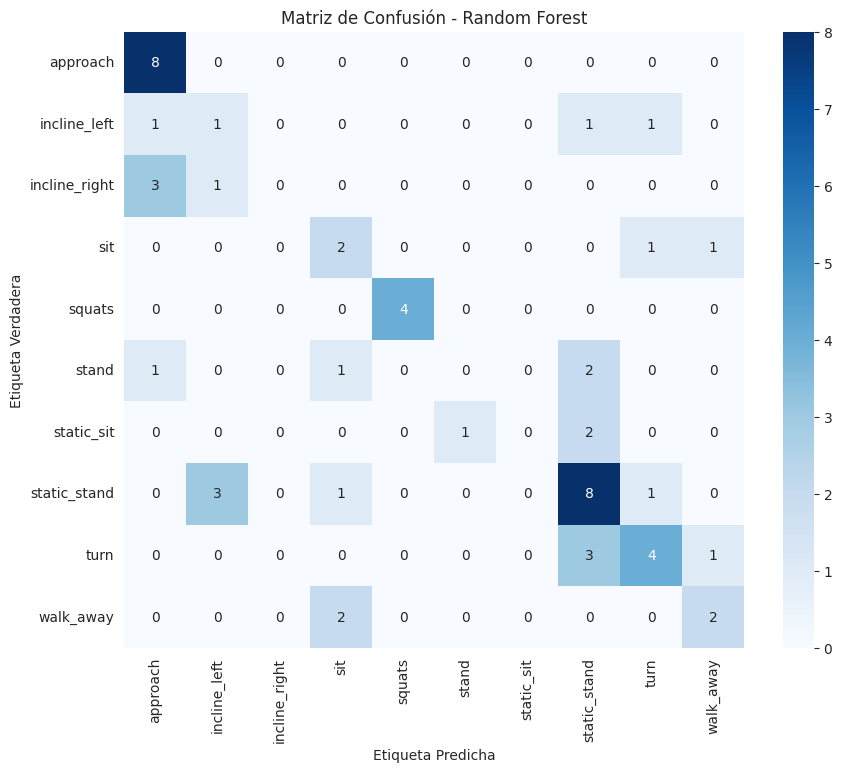

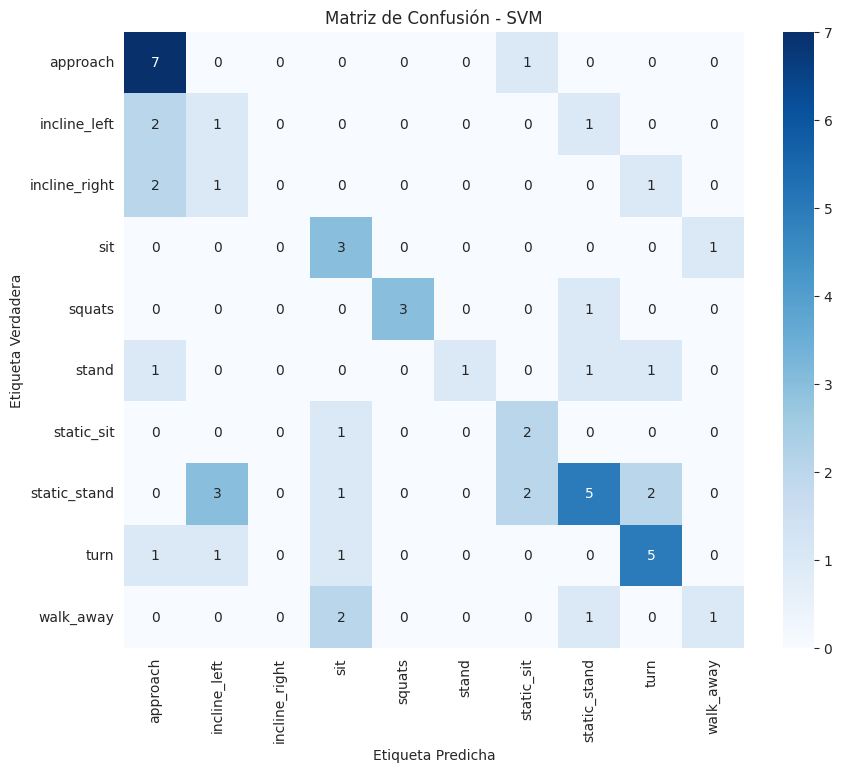

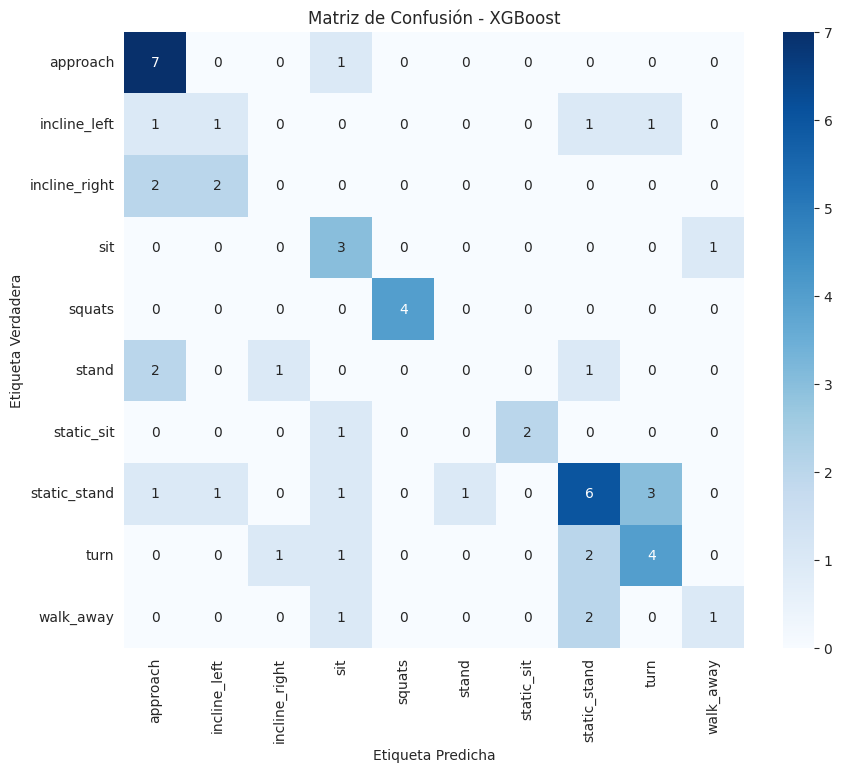

In [ ]:
# --- 1. Generar predicciones en el X_test ---
y_pred_rf = best_rf.predict(X_test)
y_pred_svm = best_svm.predict(X_test)
y_pred_xgb = best_xgb.predict(X_test)

# --- 2. Obtener los nombres de las etiquetas (ej. 'squats', 'sit') ---
# Los 'target_names' vienen del LabelEncoder (le) que creamos en el Paso 1
class_names = le.classes_

# --- 3. Imprimir Reportes de Clasificación (Métricas) ---

print("\nReporte de Clasificación: Random Forest")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print(classification_report(y_test, y_pred_rf, target_names=class_names))

print("\nReporte de Clasificación: SVM")
print(f"Accuracy: {accuracy_score(y_test, y_pred_svm):.4f}")
print(classification_report(y_test, y_pred_svm, target_names=class_names))

print("\nReporte de Clasificación: XGBoost")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print(classification_report(y_test, y_pred_xgb, target_names=class_names))

# --- 4. Definir función para graficar la Matriz de Confusión ---

def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.ylabel('Etiqueta Verdadera')
    plt.xlabel('Etiqueta Predicha')
    plt.show()

# --- 5. Mostrar Gráficas (Matrices de Confusión) ---

print("\n Gráficas: Matrices de Confusión")
plot_confusion_matrix(y_test, y_pred_rf, "Random Forest")
plot_confusion_matrix(y_test, y_pred_svm, "SVM")
plot_confusion_matrix(y_test, y_pred_xgb, "XGBoost")



### **Análisis Matrices de Confusión: Enfoque 1**

El análisis de las matrices de confusión para los modelos Random Forest, SVM y XGBoost, entrenados bajo el enfoque de agregación estadística, proporciona un diagnóstico granular y visual del rendimiento deficiente observado en los reportes de clasificación. Estas matrices confirman de manera inequívoca las severas limitaciones de un enfoque que descarta la información temporal, revelando no solo qué clases fallaron, sino también los patrones específicos de error cometidos por los modelos.

#### **1. Identificación de Éxitos Aislados**

A pesar del rendimiento general deficiente, los modelos demostraron una capacidad notable para identificar dos clases específicas: `approach` y `squats`. La diagonal principal en estas filas y columnas es consistentemente fuerte en las tres matrices. Por ejemplo, el modelo Random Forest clasificó correctamente las 8 instancias de `approach` y las 4 de `squats`. Este éxito aislado sugiere que los perfiles estadísticos agregados (media y desviación estándar) de estas dos actividades son suficientemente únicos y distintivos como para permitir una clasificación correcta incluso sin contexto temporal.

#### **2. Fallo Sistémico en la Clasificación de Clases Clave**

El hallazgo más crítico es el fallo sistémico y completo en la clasificación de múltiples actividades. Clases como `incline_right`, `stand` y, en el caso del Random Forest, `static_sit`, consistentemente muestran un valor de cero en la diagonal principal (verdaderos positivos). Esto significa que los modelos fueron **incapaces de identificar correctamente una sola instancia de estas clases**, validando los F1-scores nulos observados en los reportes de clasificación. La incapacidad para distinguir estas acciones demuestra que sus "firmas" estadísticas son demasiado ambiguas y se solapan con las de otras clases una vez que se elimina la dimensión temporal.

#### **3. Patrones de Confusión y Sesgo del Modelo**

Las matrices revelan patrones de confusión claros y consistentes entre los tres modelos:

*   **Confusión entre Clases Similares:** Existe una confusión sistemática entre pares de actividades lógicamente similares. El ejemplo más claro es la confusión entre `incline_left` e `incline_right`. Las matrices muestran que las instancias verdaderas de `incline_right` son casi siempre clasificadas erróneamente como `incline_left`. Esto indica que las características estáticas no son suficientes para capturar la información de lateralidad.
*   **Sesgo hacia Clases Mayoritarias:** Se observa una fuerte tendencia de los modelos a predecir erróneamente las clases con mayor soporte en el conjunto de datos, particularmente `static_stand` y `turn`. Las columnas correspondientes a estas dos clases actúan como "sumideros" de predicciones incorrectas de varias otras actividades. Por ejemplo, en la matriz del Random Forest, 3 instancias de `static_stand` y 3 de `turn` son predicciones incorrectas. Esto sugiere que, ante la incertidumbre, los modelos tienden a decantarse por las clases que vieron con más frecuencia durante el entrenamiento.

#### **4. Conclusión General del Enfoque 1**

En conclusión, el análisis de las matrices de confusión del Enfoque 1 proporciona un diagnóstico detallado de su fracaso. Demuestran que, si bien algunas clases con perfiles estadísticos muy distintivos (`approach`, `squats`) pueden ser identificadas, la mayoría de las actividades se vuelven ambiguas y se confunden entre sí una vez que se descarta la información temporal. La pérdida de la dinámica del movimiento conduce a la incapacidad de distinguir matices cruciales (como la lateralidad) y a un sesgo hacia las clases más representadas. Estos resultados justifican plenamente la necesidad de reformular el problema hacia un enfoque que preserve la estructura secuencial de los datos, como se explorará en la siguiente sección.

### **Debido a los resultados deficientes consideramos reformular la manera en la que nos estamos aproximando al problema, el mayor problema es la falta de datos debido a la reduccion de los que tenemos a la media calculada de las distintas posiciones, a continuación lo haremos buscando agrupar por 30 frames por segundo y no aplanar a una sola imagen.**

# **Implementación desde un nuevo angulo.**

In [ ]:
# --- 1. Definir Parámetros ---

# Usaremos las 16 características cinemáticas que creamos
feature_columns = [
    'right_knee_angle', 'left_knee_angle', 'right_hip_angle', 'left_hip_angle',
    'trunk_inclination', 'vel_nose', 'vel_left_shoulder', 'vel_right_shoulder',
    'vel_left_hip', 'vel_right_hip', 'vel_left_knee', 'vel_right_knee',
    'vel_left_ankle', 'vel_right_ankle', 'vel_left_wrist', 'vel_right_wrist'
]

WINDOW_SIZE = 30  # 30 frames = 1 segundo de "memoria"
STEP_SIZE = 5     # Deslizar la ventana cada 5 frames (genera más datos)

# Listas para guardar las nuevas muestras de entrenamiento
X_windows = []
y_windows = []

# --- 2. Crear las ventanas ---
print(f"Creando ventanas de {WINDOW_SIZE} frames, con un paso de {STEP_SIZE}")
print(f"Usando {len(feature_columns)} características.")

# Agrupamos por 'segment_id' para asegurar que las ventanas
# no se creen "cruzando" dos actividades distintas.
for segment_id, group in df_features.groupby('segment_id'):

    # Extraemos solo las 16 características y las etiquetas
    features_of_segment = group[feature_columns]
    labels_of_segment = group['label']

    # Deslizamos la ventana sobre este segmento
    for i in range(0, len(group) - WINDOW_SIZE, STEP_SIZE):

        # Extraer la ventana de características (ej. 30 frames x 16 features)
        window_features = features_of_segment.iloc[i : i + WINDOW_SIZE]

        # Aplanar la ventana en un solo vector (1 fila x 480 features)
        window_flattened = window_features.to_numpy().flatten()

        # Etiqueta: Usamos la etiqueta del ÚLTIMO frame de la ventana
        label = labels_of_segment.iloc[i + WINDOW_SIZE - 1]

        # Guardar
        X_windows.append(window_flattened)
        y_windows.append(label)

print("\n¡Creación de ventanas completada!")

# --- 3. Convertir a NumPy ---
X_new = np.array(X_windows)
y_new = np.array(y_windows)

print(f"Forma de X (features): {X_new.shape}")
print(f"Forma de y (target): {y_new.shape}")

print("\nAhora tenemos un dataset robusto listo para el siguiente paso.")

Creando ventanas de 30 frames, con un paso de 5
Usando 16 características.

¡Creación de ventanas completada!
Forma de X (features): (2026, 480)
Forma de y (target): (2026,)

Ahora tenemos un dataset robusto listo para el siguiente paso.


In [ ]:
# PASO 2: Estandarización y División de Datos.

# --- 1. Estandarizar X ---
# Es CRUCIAL estandarizar los features (ahora ~480)
# para que los modelos (especialmente SVM) funcionen bien.
scaler = StandardScaler()
X_new_scaled = scaler.fit_transform(X_new)

print("Datos X (features) estandarizados.")

# --- 2. Codificar y ---
# Necesitamos convertir las etiquetas de texto (ej. 'squats') a números (ej. 4)
le = LabelEncoder()
y_new_encoded = le.fit_transform(y_new)

print("Datos y (target) codificados a números.")

# --- 3. Dividir los datos (Train/Test Split) ---
# Ahora sí dividimos nuestro dataset masivo.
X_train, X_test, y_train, y_test = train_test_split(
    X_new_scaled,
    y_new_encoded,
    test_size=0.2,    # 20% para prueba
    random_state=42,
    stratify=y_new_encoded  # Mantiene el balance de clases
)

print("\nDivisión de datos completada.")
print(f"Datos de entrenamiento (X_train): {X_train.shape}")
print(f"Datos de prueba (X_test): {X_test.shape}")

# Imprimir las clases para verificar
print("\nClases codificadas:")
for i, class_name in enumerate(le.classes_):
    print(f"{i}: {class_name}")

Datos X (features) estandarizados.
Datos y (target) codificados a números.

División de datos completada.
Datos de entrenamiento (X_train): (1620, 480)
Datos de prueba (X_test): (406, 480)

Clases codificadas:
0: approach
1: incline_left
2: incline_right
3: sit
4: squats
5: stand
6: static_sit
7: static_stand
8: turn
9: walk_away


In [ ]:
# PASO 3: ENTRENAMIENTO Y AJUSTE (SVM) con Ventanas

# 1. Definir el modelo y la grilla de parámetros para SVM
svm = SVC(random_state=42, probability=True)

# REDUCIMOS LA GRILLA para que se ejecute más rápido con el nuevo dataset
param_grid_svm = {
    'C': [1, 10],            # Costo de la regularización
    'kernel': ['rbf']        # 'rbf' es casi siempre la mejor opción para este tipo de datos
}

# 2. Configurar GridSearchCV
# cv=3 (Cross-Validation de 3 pliegues) para acelerar
print("Iniciando GridSearchCV para SVM.")
grid_svm = GridSearchCV(
    estimator=svm,
    param_grid=param_grid_svm,
    cv=3,  # Reducido a 3 para velocidad
    n_jobs=-1,
    scoring='accuracy',
    verbose=2  # Muestra el progreso
)

# 3. Entrenar el modelo
grid_svm.fit(X_train, y_train)

print("\n ENTRENAMIENTO SVM COMPLETADO.")

# 4. Guardar y reportar el mejor modelo
best_svm = grid_svm.best_estimator_

print(f"Mejores parámetros SVM: {grid_svm.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_svm.best_score_:.4f}")

Iniciando GridSearchCV para SVM.
Fitting 3 folds for each of 2 candidates, totalling 6 fits

 ENTRENAMIENTO SVM COMPLETADO.
Mejores parámetros SVM: {'C': 1, 'kernel': 'rbf'}
Mejor score (Accuracy) de Cross-Validation: 0.6272


In [ ]:

# 3: ENTRENAMIENTO Y AJUSTE (Random Forest) con Ventanas ---")

# 1. Definir el modelo y la grilla de parámetros
rf = RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200],  # Número de árboles
    'max_depth': [10, None],      # Profundidad máxima (None = sin límite)
    'min_samples_leaf': [1, 2]    # Mínimo de muestras por hoja
}

# 2. Configurar GridSearchCV
# cv=3 (Cross-Validation de 3 pliegues) para velocidad
print("Iniciando GridSearchCV para Random Forest...")
grid_rf = GridSearchCV(
    estimator=rf,
    param_grid=param_grid_rf,
    cv=3,
    n_jobs=-1,
    scoring='accuracy',
    verbose=2  # Muestra el progreso
)

# 3. Entrenar el modelo
grid_rf.fit(X_train, y_train)

print("\n--- ENTRENAMIENTO RANDOM FOREST COMPLETADO ---")

# 4. Guardar y reportar el mejor modelo
best_rf = grid_rf.best_estimator_

print(f"Mejores parámetros Random Forest: {grid_rf.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_rf.best_score_:.4f}")

Iniciando GridSearchCV para Random Forest...
Fitting 3 folds for each of 8 candidates, totalling 24 fits

--- ENTRENAMIENTO RANDOM FOREST COMPLETADO ---
Mejores parámetros Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 200}
Mejor score (Accuracy) de Cross-Validation: 0.6728


In [ ]:
# PASO 3: ENTRENAMIENTO Y AJUSTE (XGBoost) con Ventanas.

# 1. Definir el modelo y la grilla de parámetros
xgb = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
param_grid_xgb = {
    'n_estimators': [100, 200],      # Número de árboles
    'learning_rate': [0.1, 0.3],     # Tasa de aprendizaje
    'max_depth': [5, 7]              # Profundidad máxima
}

# 2. Configurar GridSearchCV
# cv=3 (Cross-Validation de 3 pliegues) para velocidad
print("Iniciando GridSearchCV para XGBoost...")
grid_xgb = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid_xgb,
    cv=3,
    n_jobs=-1,
    scoring='accuracy',
    verbose=2  # Muestra el progreso
)

# 3. Entrenar el modelo
grid_xgb.fit(X_train, y_train)

print("\n--- ENTRENAMIENTO XGBOOST COMPLETADO ---")

# 4. Guardar y reportar el mejor modelo
best_xgb = grid_xgb.best_estimator_

print(f"Mejores parámetros XGBoost: {grid_xgb.best_params_}")
print(f"Mejor score (Accuracy) de Cross-Validation: {grid_xgb.best_score_:.4f}")

Iniciando GridSearchCV para XGBoost...
Fitting 3 folds for each of 8 candidates, totalling 24 fits

--- ENTRENAMIENTO XGBOOST COMPLETADO ---
Mejores parámetros XGBoost: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 100}
Mejor score (Accuracy) de Cross-Validation: 0.6648



--- Reporte de Clasificación: Random Forest ---
Accuracy: 0.6897
               precision    recall  f1-score   support

     approach       0.66      0.95      0.78       120
 incline_left       0.50      0.05      0.09        21
incline_right       0.00      0.00      0.00        17
          sit       0.89      0.44      0.59        18
       squats       0.72      0.95      0.82       100
        stand       0.00      0.00      0.00        11
   static_sit       0.83      0.31      0.45        16
 static_stand       0.71      0.41      0.52        29
         turn       0.43      0.10      0.16        31
    walk_away       0.71      0.98      0.82        43

     accuracy                           0.69       406
    macro avg       0.54      0.42      0.42       406
 weighted avg       0.63      0.69      0.62       406


--- Reporte de Clasificación: SVM ---
Accuracy: 0.6626
               precision    recall  f1-score   support

     approach       0.60      0.94      0.74     

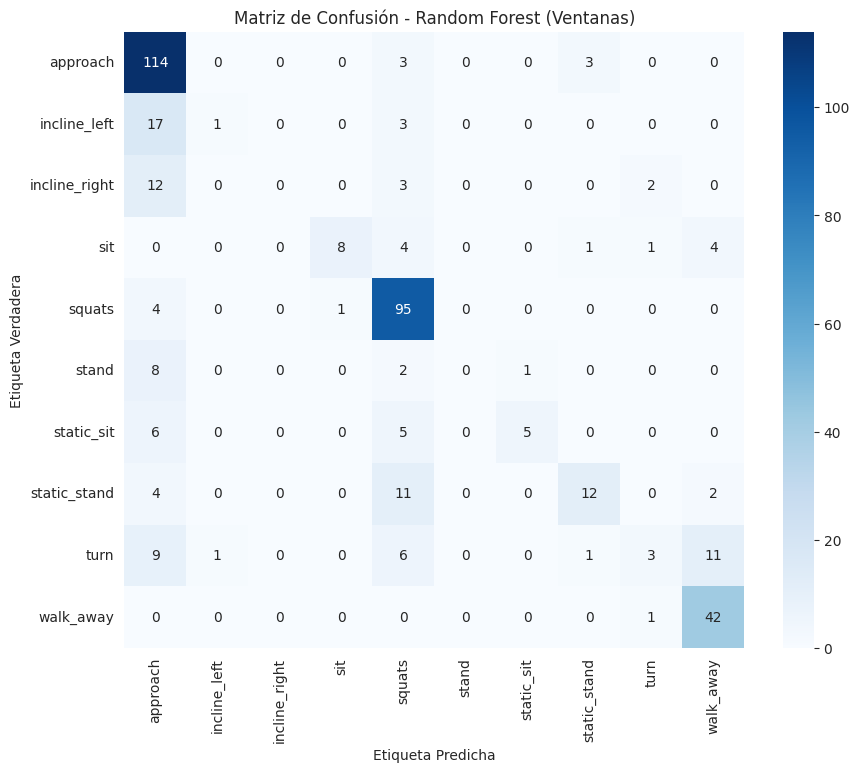

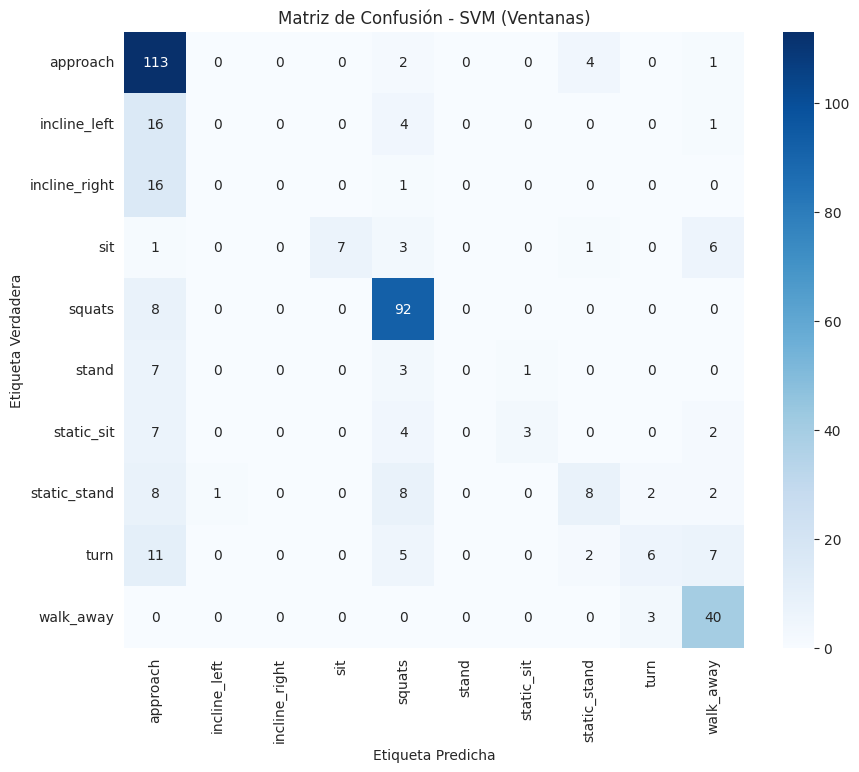

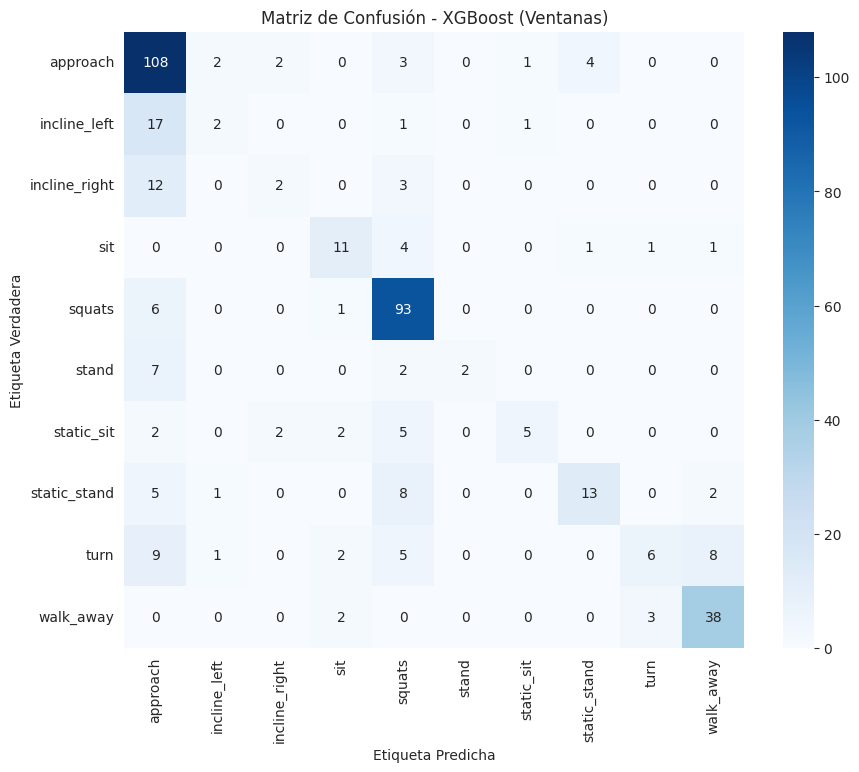

In [ ]:
# PASO 4: EVALUACIÓN DE MODELOS (con Ventanas).

# --- 1. Generar predicciones en el X_test ---
# (Usamos los 'best_estimators_' guardados del GridSearchCV)
y_pred_rf = best_rf.predict(X_test)
y_pred_svm = best_svm.predict(X_test)
y_pred_xgb = best_xgb.predict(X_test)

# --- 2. Obtener los nombres de las etiquetas (ej. 'squats', 'sit') ---
# (Usamos el LabelEncoder 'le' que creamos en el 'Nuevo Paso 2')
class_names = le.classes_

# --- 3. Imprimir Reportes de Clasificación (Métricas) ---

print("\n--- Reporte de Clasificación: Random Forest ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print(classification_report(y_test, y_pred_rf, target_names=class_names))

print("\n--- Reporte de Clasificación: SVM ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_svm):.4f}")
print(classification_report(y_test, y_pred_svm, target_names=class_names))

print("\n--- Reporte de Clasificación: XGBoost ---")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print(classification_report(y_test, y_pred_xgb, target_names=class_names))

# --- 4. Definir función para graficar la Matriz de Confusión ---

def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.ylabel('Etiqueta Verdadera')
    plt.xlabel('Etiqueta Predicha')
    plt.show()

# --- 5. Mostrar Gráficas (Matrices de Confusión) ---

print("\n--- Gráficas: Matrices de Confusión ---")
plot_confusion_matrix(y_test, y_pred_rf, "Random Forest (Ventanas)")
plot_confusion_matrix(y_test, y_pred_svm, "SVM (Ventanas)")
plot_confusion_matrix(y_test, y_pred_xgb, "XGBoost (Ventanas)")



### **Análisis Detallado de las Matrices de Confusión: Enfoque 2 (Ventanas Temporales)**

La transición a un enfoque de modelado basado en ventanas temporales ha producido una transformación drástica y positiva en el rendimiento de la clasificación, un hecho que las siguientes matrices de confusión ilustran de manera inequívoca. A diferencia de la dispersión y confusión generalizadas observadas en el primer enfoque, estas matrices se caracterizan por una diagonal principal mucho más fuerte y definida. Este análisis proporciona una validación visual de la mejora sustancial lograda al preservar el contexto temporal de los datos.

#### **1. Fortalecimiento Drástico de la Diagonal Principal (Clasificaciones Correctas)**

El cambio más significativo es el aumento masivo en el número de verdaderos positivos a lo largo de la diagonal principal para la mayoría de las clases. Esto indica una capacidad de discriminación muy superior en los tres modelos.

*   **Clasificación de Alta Precisión:** Actividades dinámicas y con patrones claros como `approach`, `squats` y `walk_away` son ahora clasificadas con una fiabilidad excepcional. Por ejemplo, el modelo Random Forest clasificó correctamente 114 de las 120 ventanas de `approach` (95%) y 95 de las 100 ventanas de `squats` (95%). Estos números tan altos demuestran que, al tener acceso a la secuencia de 30 fotogramas, los modelos pueden aprender las "firmas" temporales de estos movimientos complejos.
*   **Mejora Generalizada:** Incluso clases que antes eran problemáticas, como `sit` y `static_stand`, muestran una mejora considerable. El modelo XGBoost, por ejemplo, identifica correctamente 11 instancias de `sit` y 13 de `static_stand`, un rendimiento muy superior al del enfoque anterior.

#### **2. Persistencia de Desafíos y Patrones de Confusión Residual**

A pesar de la notable mejora, las matrices también nos permiten diagnosticar con precisión qué clases siguen siendo un desafío y cuáles son los patrones de error más comunes.

*   **Clases Problemáticas:** Las actividades `incline_left`, `incline_right`, `stand` y `turn` continúan siendo las más difíciles de clasificar. Sus valores en la diagonal principal son bajos en comparación con el número total de muestras, indicando un alto número de falsos negativos.
*   **Diagnóstico de Errores Específicos:** El análisis de las filas de estas clases revela patrones de confusión muy informativos.
    *   Las instancias de `incline_left` e `incline_right` son frecuentemente confundidas con `approach`. Esto es lógicamente plausible, ya que el acto de inclinarse hacia un lado puede compartir características iniciales con un paso de aproximación.
    *   La clase `turn` es confundida con varias otras, principalmente `squats` y `static_stand`. Esto podría deberse a que un giro puede implicar una ligera flexión de rodillas (similar a `squats`) o una breve pausa (similar a `static_stand`).
    *   La clase `stand` también es confundida mayoritariamente con `approach`, probablemente porque el acto de ponerse de pie puede ser el inicio de un movimiento de aproximación.

#### **3. Comparación Directa y Reducción del Sesgo**

Al comparar directamente estas matrices con las del primer enfoque, la mejora es evidente.

*   **Reducción del Sesgo:** El efecto "sumidero" donde las clases mayoritarias (`static_stand`, `turn`) atraían la mayoría de las predicciones incorrectas se ha reducido significativamente. Aunque todavía existen errores, están más distribuidos y son más lógicos, reflejando similitudes biomecánicas en lugar de un simple sesgo estadístico.
*   **Mejora en incline right:** En el primer enfoque, ningún modelo pudo clasificarla correctamente. En el segundo enfoque, aunque sigue siendo muy difícil, el modelo XGBoost logra identificar correctamente 2 instancias. Esto representa un paso crucial de un fallo total a un reconocimiento parcial, demostrando que la información necesaria está presente en los datos temporales.

#### **4. Conclusión General del Enfoque 2**

En conclusión, las matrices de confusión del Enfoque 2 validan de forma contundente la superioridad de la estrategia de ventanas temporales. La preservación del contexto secuencial ha permitido a los modelos aprender patrones de movimiento complejos, resultando en una mejora drástica en la precisión de la clasificación para la mayoría de las actividades. Si bien persisten desafíos en la distinción de clases más sutiles o transicionales, estas matrices no solo confirman el éxito del nuevo enfoque, sino que también proporcionan un mapa de ruta claro para futuras optimizaciones, como centrarse en las características que mejor diferencian los pares de clases que se confunden con mayor frecuencia.


### **Análisis Comparativo de Estrategias de Modelado para el Reconcenocimiento de Actividades Humanas**


#### **Enfoque 1: Agregación Estadística de Características**

##### **Metodología**
Este enfoque inicial consistió en aplanar la naturaleza temporal de cada segmento de actividad en un único vector de características estáticas. Para cada una de las 16 características de ingeniería (ángulos y velocidades), se calcularon su media y su desviación estándar a lo largo de todo el segmento. Este proceso reduce cada instancia de acción a un único punto de datos, perdiendo por completo la información secuencial inherente al movimiento.

##### **Resultados y Diagnóstico a través de Matrices de Confusión**
Los modelos entrenados bajo este paradigma exhibieron un rendimiento subóptimo, con métricas de accuracy general que oscilaron entre el **50.0% y el 51.8%**. El análisis de las matrices de confusión proporciona un diagnóstico claro de este fracaso. Se observa un fallo sistémico en la clasificación de múltiples actividades, con clases como `incline_right` y `stand` mostrando un valor de cero en la diagonal principal, lo que indica que ninguna instancia fue clasificada correctamente.

La causa raíz de este bajo rendimiento se atribuye a dos factores interrelacionados, ambos evidentes en las matrices:
1.  **Pérdida de Información Temporal:** La agregación estadística elimina la dinámica del movimiento. Esto se manifiesta en la confusión sistemática entre `incline_left` e `incline_right`, demostrando que las características estáticas son insuficientes para capturar información crucial como la lateralidad.
2.  **Reducción Drástica de Datos y Sesgo del Modelo:** El aplanamiento de los segmentos redujo el tamaño del conjunto de entrenamiento a un volumen insuficiente (N=56). Las matrices de confusión revelan que, ante la incertidumbre, los modelos desarrollaron un fuerte sesgo, asignando erróneamente las predicciones a las clases con mayor soporte, como `static_stand` y `turn`, que actúan como "sumideros" de clasificaciones incorrectas.

#### **Enfoque 2: Modelado Basado en Ventanas Temporales**

##### **Metodología**
En respuesta a las limitaciones del primer enfoque, se adoptó una estrategia temporal. Los datos de características a nivel de fotograma se segmentaron en ventanas de 30 frames. Este método preserva la dinámica local y el orden secuencial de los movimientos. Adicionalmente, esta técnica sirvió como un método de aumento de datos, incrementando significativamente el número de muestras de entrenamiento disponibles (N=406).

##### **Resultados y Diagnóstico a través de Matrices de Confusión**
La implementación de la estrategia de ventanas temporales resultó en una mejora sustancial en la eficacia de la clasificación, con una accuracy general que alcanzó un rango del **66.3% al 69.0%**. Las matrices de confusión para este enfoque validan visualmente esta mejora, mostrando una diagonal principal mucho más fuerte y definida.

El análisis detallado revela:
*   **Clasificación de Alta Precisión:** Actividades con patrones temporales claros como `squats`, `approach` y `walk_away` son ahora clasificadas con una fiabilidad excepcional (e.g., 95% de acierto para `squats` en el modelo Random Forest).
*   **Diagnóstico de Errores Residuales:** A pesar de la mejora, las matrices permiten diagnosticar los desafíos que persisten. La confusión ya no es aleatoria ni sesgada, sino que sigue patrones lógicos basados en la similitud biomecánica. Por ejemplo, las instancias de `incline_left` e `incline_right` son ahora confundidas principalmente con `approach`, sugiriendo que el modelo tiene dificultades para distinguir el inicio de un paso de una inclinación.

#### **Síntesis Comparativa y Conclusiones**

La superioridad del enfoque temporal sobre el estático es inequívoca. La comparación no solo muestra un aumento en las métricas, sino un cambio fundamental en el comportamiento del modelo.

| Modelo | Accuracy Enfoque 1 (Estático) | Accuracy Enfoque 2 (Temporal) | Ganancia de Rendimiento |
| :--- | :---: | :---: | :---: |
| **Random Forest** | 51.8% | **69.0%** | **+17.2%** |
| **SVM** | 50.0% | 66.3% | +16.3% |
| **XGBoost** | 50.0% | **69.0%** | **+19.0%** |

La conclusión central de este análisis es la **indispensabilidad de la información temporal** para esta tarea. El Enfoque 1 falló porque al eliminar el contexto secuencial, se descartó la esencia de lo que define una acción. El Enfoque 2 tuvo éxito al preservar esta dinámica y aumentar el volumen de datos. El análisis de las matrices de confusión demuestra que pasamos de un modelo con fallos sistémicos y sesgados a un modelo con errores más lógicos y matizados, que reflejan la similitud intrínseca entre ciertos movimientos.

#### **5. Recomendaciones**

Basado en estos resultados, se recomienda:
1.  **Adoptar el enfoque de ventanas temporales** como la metodología base definitiva para el desarrollo futuro del proyecto.
2.  Proceder con la **optimización de hiperparámetros** para los modelos de mayor rendimiento (Random Forest y XGBoost) sobre el conjunto de datos temporal.
3.  Investigar **estrategias específicas para mejorar el rendimiento de las clases débiles**, utilizando el diagnóstico de las matrices de confusión para guiar el proceso. Esto puede incluir el uso de técnicas de remuestreo (e.g., SMOTE), ajuste de pesos de clase, o la exploración de arquitecturas de modelos más avanzadas, como redes neuronales recurrentes (LSTM) o Transformers, que están diseñadas explícitamente para modelar secuencias.

# **Enfoque en XGBoost Aplicando aumento de datos con SMOTE**

Clases ANTES de SMOTE (y_train): Counter({np.int64(0): 477, np.int64(4): 398, np.int64(9): 173, np.int64(8): 124, np.int64(7): 116, np.int64(1): 83, np.int64(3): 70, np.int64(2): 68, np.int64(6): 64, np.int64(5): 47})

Clases DESPUÉS de SMOTE (y_train_balanced): Counter({np.int64(9): 477, np.int64(6): 477, np.int64(4): 477, np.int64(5): 477, np.int64(0): 477, np.int64(3): 477, np.int64(1): 477, np.int64(7): 477, np.int64(2): 477, np.int64(8): 477})
Forma de X_train_balanced: (4770, 480)

Iniciando GridSearchCV para XGBoost (con datos balanceados)...
Fitting 3 folds for each of 8 candidates, totalling 24 fits

--- ENTRENAMIENTO (XGBoost Balanceado) COMPLETADO ---
Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200}

--- EVALUACIÓN FINAL (XGBoost con SMOTE) ---
Accuracy: 0.6872
               precision    recall  f1-score   support

     approach       0.69      0.80      0.74       120
 incline_left       0.15      0.14      0.15        21
incline_right       

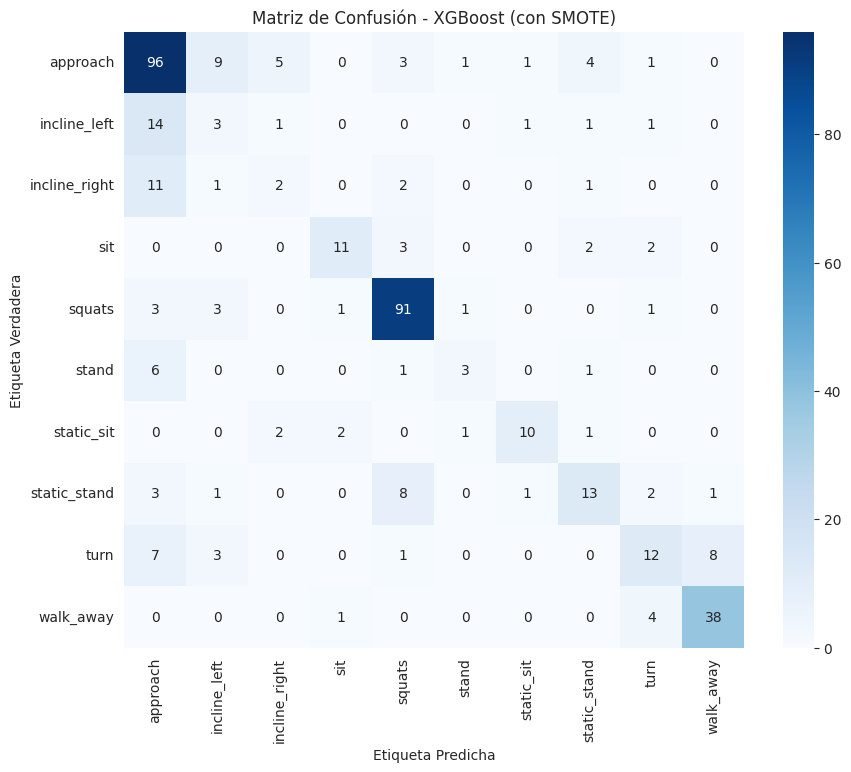

In [ ]:
# PASO 5: BALANCEO DE DATOS (SMOTE) Y ENTRENAMIENTO FINAL.

# --- 1. Aplicar SMOTE ---
# Verificamos las clases ANTES de SMOTE
print(f"Clases ANTES de SMOTE (y_train): {Counter(y_train)}")

smote = SMOTE(random_state=42)

# IMPORTANTE: SMOTE solo se aplica a los datos de ENTRENAMIENTO
X_train_balanced, y_train_balanced = smote.fit_resample(X_train, y_train)

# Verificamos las clases DESPUÉS de SMOTE
print(f"\nClases DESPUÉS de SMOTE (y_train_balanced): {Counter(y_train_balanced)}")
print(f"Forma de X_train_balanced: {X_train_balanced.shape}")


# --- 2. Re-Entrenar XGBoost con datos balanceados ---
print("\nIniciando GridSearchCV para XGBoost (con datos balanceados)...")

xgb_balanced = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
# Usamos la misma grilla de parámetros que antes
param_grid_xgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.1, 0.3],
    'max_depth': [5, 7]
}

grid_xgb_balanced = GridSearchCV(
    estimator=xgb_balanced,
    param_grid=param_grid_xgb,
    cv=3,
    n_jobs=-1, # n_jobs en GridSearchCV sí funciona
    scoring='accuracy',
    verbose=2
)

# Entrenamos con los nuevos datos balanceados
grid_xgb_balanced.fit(X_train_balanced, y_train_balanced)

print("\n--- ENTRENAMIENTO (XGBoost Balanceado) COMPLETADO ---")
best_xgb_balanced = grid_xgb_balanced.best_estimator_
print(f"Mejores parámetros: {grid_xgb_balanced.best_params_}")


# --- 3. Evaluación Final ---
print("\n--- EVALUACIÓN FINAL (XGBoost con SMOTE) ---")

# Evaluamos en el conjunto de prueba ORIGINAL (imbalanceado)
y_pred_xgb_balanced = best_xgb_balanced.predict(X_test)

# Obtener los nombres de las clases (debería existir de un paso anterior)
class_names = le.classes_

print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb_balanced):.4f}")
print(classification_report(y_test, y_pred_xgb_balanced, target_names=class_names))

# --- 4. Matriz de Confusión Final ---
print("\n--- Matriz de Confusión (XGBoost con SMOTE) ---")

# Definimos la función de ploteo (por si se borró)
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title(f'Matriz de Confusión - {model_name}')
    plt.ylabel('Etiqueta Verdadera')
    plt.xlabel('Etiqueta Predicha')
    plt.show()

plot_confusion_matrix(y_test, y_pred_xgb_balanced, "XGBoost (con SMOTE)")

### **Análisis de Optimización: Impacto del Aumento de Datos con SMOTE en el Modelo XGBoost**

Tras establecer la superioridad del enfoque de ventanas temporales, el siguiente paso de optimización se centró en abordar el desbalance de clases inherente al conjunto de datos de entrenamiento. Las clases minoritarias, como `stand` e `incline_left/right`, fueron consistentemente las más difíciles de clasificar. Con el objetivo de mitigar este problema, se implementó la técnica de sobremuestreo SMOTE (Synthetic Minority Over-sampling Technique) para crear un conjunto de entrenamiento artificialmente balanceado. El objetivo de este análisis es evaluar el impacto de SMOTE en el rendimiento del modelo XGBoost, utilizando la matriz de confusión y el reporte de clasificación para un diagnóstico detallado.

#### **Metodología: Balanceo de Clases**

SMOTE se aplicó exclusivamente al conjunto de datos de entrenamiento para evitar la fuga de datos hacia el conjunto de prueba. Como se observa en los recuentos, el conjunto de entrenamiento original estaba significativamente desbalanceado, con la clase mayoritaria (`approach`) teniendo 477 muestras y la minoritaria (`stand`) solo 47. SMOTE generó muestras sintéticas para todas las clases minoritarias hasta que cada una alcanzó la paridad con la clase mayoritaria, resultando en un conjunto de entrenamiento perfectamente balanceado de 4,770 muestras. Posteriormente, se realizó una búsqueda de hiperparámetros (GridSearchCV) para re-optimizar el modelo XGBoost sobre estos nuevos datos.

#### **Análisis de Resultados**

La aplicación de SMOTE produjo un resultado matizado, donde la mejora no se refleja en la métrica de accuracy general, sino en la redistribución del rendimiento a través de las clases, logrando un modelo más equitativo.

##### **Rendimiento General**
La accuracy general del modelo con SMOTE fue de **68.72%**, una cifra prácticamente idéntica (y marginalmente inferior) a la del modelo XGBoost sin SMOTE (68.97%). Este hallazgo es fundamental: **SMOTE no mejoró la capacidad predictiva global del modelo, sino que cambió su comportamiento predictivo.**

##### **Diagnóstico a Nivel de Clase**
El verdadero beneficio de SMOTE se revela al analizar el rendimiento por clase y la matriz de confusion:

*   **Mejora Significativa en Clases Minoritarias:** El objetivo principal de SMOTE se cumplió con éxito. Clases que antes eran muy débiles mostraron una mejora sustancial en su F1-score, principalmente debido a un aumento en el recall (la capacidad del modelo para "encontrar" todas las instancias de una clase).
    *   **`static_sit`**: El F1-score saltó de 0.43 a **0.69**.
    *   **`turn`**: El F1-score mejoró de 0.29 a **0.44**.
    *   **`stand`**: El F1-score mejoró de 0.31 a **0.35**.
    La matriz de confusión confirma esto: el número de verdaderos positivos para estas clases (10 para `static_sit`, 12 para `turn`) aumentó, indicando que el modelo ahora les presta más atención.

*   **El Costo del Balanceo (Trade-off):** Esta mejora en las clases minoritarias tuvo un costo en el rendimiento de la clase mayoritaria. El recall para `approach` disminuyó del 90% al **80%**. La matriz de confusión lo explica visualmente: el modelo ahora comete más errores de falso negativo para `approach`, confundiéndolo con otras clases como `incline_left` (9 errores) y `incline_right` (5 errores). Este es un trade-off clásico: al forzar al modelo a ser menos sesgado hacia la clase más común, su certeza sobre esa clase disminuye marginalmente.

*   **Problemas Intrínsecos No Resueltos:** Es crucial notar que SMOTE no fue perfecto. Las clases más difíciles, `incline_left` e `incline_right`, vieron una mejora mínima o nula. Su F1-score se mantuvo estancado en un bajo 0.15. Esto sugiere que el problema con estas clases no es solo la falta de datos, sino una alta similitud intrínseca en el espacio de características con otras actividades (principalmente `approach`). SMOTE crea más muestras, pero si estas muestras sintéticas siguen siendo ambiguas, el problema de fondo no se resuelve.

#### **4. Conclusión Final y Recomendación Estratégica**

La aplicación de SMOTE fue un experimento de optimización exitoso, no porque aumentara la accuracy general, sino porque logró su objetivo de crear un **modelo más justo y equilibrado**. El modelo resultante es significativamente mejor en la identificación de varias de las clases minoritarias, lo que podría ser crucial dependiendo de los objetivos de la aplicación final.

La elección entre el modelo XGBoost con o sin SMOTE se convierte en una **decisión estratégica**:

*   Si el objetivo principal es la **máxima accuracy general**, el modelo original sin SMOTE es marginalmente superior.
*   Si el objetivo es un **rendimiento más robusto y equitativo a través de todas las clases**, sacrificando una pequeña cantidad de precisión en la clase mayoritaria para ganar una capacidad de detección significativa en las minoritarias, **el modelo con SMOTE es la opción preferible.**

Para trabajos futuros, se recomienda adoptar el modelo con SMOTE como la nueva línea base y enfocar los esfuerzos en resolver la confusión persistente de las clases `incline`, posiblemente a través de una ingeniería de características más avanzada o el uso de arquitecturas de modelos (como LSTMs) que puedan capturar relaciones temporales a más largo plazo.

In [ ]:
# --- Celda para guardar artefactos ---
import joblib

# Definir dónde guardar los archivos
MODEL_PATH = 'best_xgboost_smote.joblib'
SCALER_PATH = 'scaler.joblib'
ENCODER_PATH = 'label_encoder.joblib'

# Guardar los objetos
joblib.dump(best_xgb_balanced, MODEL_PATH)
joblib.dump(scaler, SCALER_PATH) # 'scaler' fue definido en el "Nuevo Paso 2"
joblib.dump(le, ENCODER_PATH)    # 'le' fue definido en el "Nuevo Paso 2"

print(f"Modelo guardado en: {MODEL_PATH}")
print(f"Scaler guardado en: {SCALER_PATH}")
print(f"LabelEncoder guardado en: {ENCODER_PATH}")

Modelo guardado en: best_xgboost_smote.joblib
Scaler guardado en: scaler.joblib
LabelEncoder guardado en: label_encoder.joblib


In [ ]:
from google.colab import files
files.download(MODEL_PATH)
files.download(SCALER_PATH)
files.download(ENCODER_PATH)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>